### FDA enfoque de mínimos cuadrados

In [118]:
from sklearn import datasets
import numpy as np
from utils import * 
from sklearn.linear_model import LinearRegression

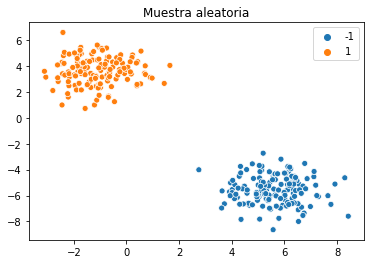

In [132]:
number_state = 1997080
X, y = datasets.make_blobs(n_samples=300, n_features=2, centers=2, random_state=number_state)
transformation = [[4, 0], [0, 0.4]]
X_aniso = np.dot(X, transformation)
aniso = (X_aniso, y)

change_cat = {0:-1, 1:1}
y_new = [change_cat[i] for i in y]

n_neg = sum([i==-1 for i in y_new])
n_pos = sum([i==1 for i in y_new])
n = len(y_new)

theta_y = []
for i in range(n):
    if y_new[i]==1:
        theta_y.append(n/n_pos)
    else:
        theta_y.append(-n/n_neg)
        
sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=y_new, palette="tab10")
plt.title("Muestra aleatoria")
plt.show()

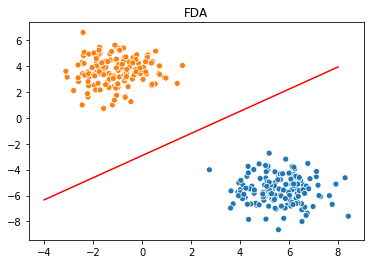

In [133]:
reg = LinearRegression().fit(X, theta_y)
x = np.linspace(start=-4,stop=8,num=1000)
y_predict = -(reg.intercept_+x*reg.coef_[0])/reg.coef_[1]

sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=y_new, legend=False, palette="tab10")
sns.lineplot(x=x, y=y_predict, color="red")
plt.title("FDA")
plt.show()

In [156]:
y_atipicos

array([0, 0])

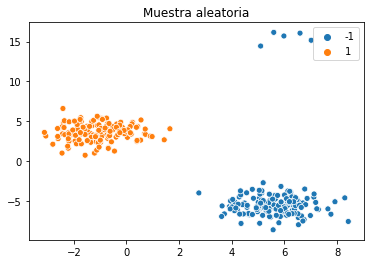

In [209]:
number_state = 1997080
X_atipicos, y_atipicos = datasets.make_blobs(n_samples=5, n_features=2, centers=1, 
                                    center_box=(20,1), random_state=number_state)

# y_atipicos = [1,1]

X_new_atipicos = np.concatenate([X,X_atipicos])
y_new_atipicos = np.concatenate([y,y_atipicos])

change_cat = {0:-1, 1:1}
y_new_atipicos = [change_cat[i] for i in y_new_atipicos]

n_neg = sum([i==-1 for i in y_new_atipicos])
n_pos = sum([i==1 for i in y_new_atipicos])
n = len(y_new_atipicos)

theta_y = []
for i in range(n):
    if y_new_atipicos[i]==1:
        theta_y.append(n/n_pos)
    else:
        theta_y.append(-n/n_neg)
        
sns.scatterplot(x=X_new_atipicos[:, 0], y=X_new_atipicos[:, 1],
                hue=y_new_atipicos, palette="tab10")
plt.title("Muestra aleatoria")
plt.show()

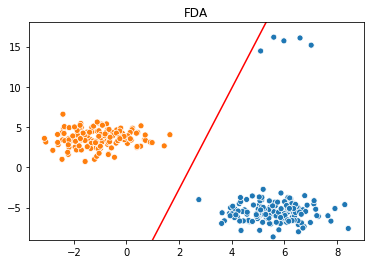

In [226]:
reg = LinearRegression().fit(X_new_atipicos, theta_y)
x = np.linspace(start=-2,stop=8,num=1000)
y_predict = -(reg.intercept_+x*reg.coef_[0])/reg.coef_[1]

sns.scatterplot(x=X_new_atipicos[:, 0], y=X_new_atipicos[:, 1], hue=theta_y, legend=False, palette="tab10")
sns.lineplot(x=x, y=y_predict, color="red")
plt.ylim(-9,18)
plt.title("FDA")
plt.show()

In [195]:
X_neg = X_new_atipicos[y_new_atipicos==np.repeat(-1, 305)]
X_pos = X_new_atipicos[y_new_atipicos==np.repeat(1, 305)]


In [200]:
c_neg = X_neg.sum(axis=0)/len(X_neg)
c_pos = X_pos.sum(axis=0)/len(X_pos)

In [202]:
def dis_euclidean(x,y):
    return np.sqrt((x[0]-y[0])**2+(x[1]-y[1])**2)

In [204]:
X_new_atipicos[1,:]

array([-1.5689993 ,  0.72559124])

In [205]:
dis = []
for i in range(n):
    if y_new_atipicos[i]==1:
        dis.append(dis_euclidean(X_new_atipicos[i,:],c_pos))
    else:
        dis.append(dis_euclidean(X_new_atipicos[i,:],c_neg))

In [206]:
w = 1/np.sqrt(dis)

In [222]:
theta_y_pesos = w*theta_y
X_new_atipicos_pesos = np.multiply(w, X_new_atipicos.T).T

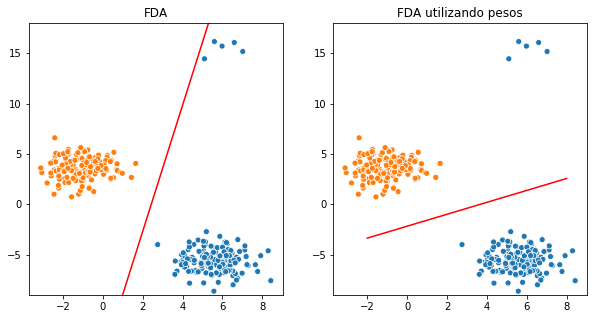

In [230]:
reg = LinearRegression().fit(X_new_atipicos_pesos, theta_y_pesos)
x = np.linspace(start=-2,stop=8,num=1000)
y_predict_regu = -(reg.intercept_+x*reg.coef_[0])/reg.coef_[1]

fig, axs = plt.subplots(ncols=2, figsize=(10,5))

sns.scatterplot(ax=axs[0], x=X_new_atipicos[:, 0], y=X_new_atipicos[:, 1], hue=theta_y, legend=False, palette="tab10")

sns.scatterplot(ax=axs[1], x=X_new_atipicos[:, 0], y=X_new_atipicos[:, 1], hue=theta_y, legend=False, palette="tab10")

sns.lineplot(ax=axs[0],x=x, y=y_predict, color="red")

sns.lineplot(ax=axs[1],x=x, y=y_predict_regu, color="red")

axs[0].set_ylim(-9,18)
axs[0].set_title("FDA")

axs[1].set_ylim(-9,18)
axs[1].set_title("FDA utilizando pesos")

plt.show()

# MNIST

In [1]:
from keras.datasets import mnist

from utils import * 

from sklearn.preprocessing import StandardScaler
from sklearn.manifold import MDS, TSNE, SpectralEmbedding
from sklearn.decomposition import PCA, KernelPCA
from sklearn.cluster import SpectralClustering

### Datos Originales

Clasiffication baseline
0
1
2
3
4
5
6
7
8
9
----------Errors train------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

           0       0.90      0.96      0.93      5923
           1       0.82      0.97      0.89      6742
           2       0.91      0.81      0.85      5958
           3       0.84      0.84      0.84      6131
           4       0.84      0.89      0.86      5842
           5       0.87      0.74      0.80      5421
           6       0.89      0.93      0.91      5918
           7       0.87      0.87      0.87      6265
           8       0.84      0.75      0.80      5851
           9       0.81      0.80      0.81      5949

    accuracy                           0.86     60000
   macro avg       0.86      0.86      0.86     60000
weighted avg       0.86      0.86      0.86     60000

----------Errors test------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score 

/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


----------Errors train------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

           0       0.97      0.98      0.97      5923
           1       0.97      0.98      0.97      6742
           2       0.94      0.92      0.93      5958
           3       0.92      0.92      0.92      6131
           4       0.95      0.95      0.95      5842
           5       0.92      0.90      0.91      5421
           6       0.96      0.97      0.96      5918
           7       0.95      0.95      0.95      6265
           8       0.90      0.91      0.90      5851
           9       0.92      0.92      0.92      5949

    accuracy                           0.94     60000
   macro avg       0.94      0.94      0.94     60000
weighted avg       0.94      0.94      0.94     60000

----------Errors test------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

           0       0.95      0.98

/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning: The ma

----------Errors train------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

           0       0.96      0.98      0.97      5923
           1       0.96      0.98      0.97      6742
           2       0.93      0.91      0.92      5958
           3       0.91      0.90      0.90      6131
           4       0.93      0.94      0.93      5842
           5       0.91      0.87      0.89      5421
           6       0.95      0.96      0.96      5918
           7       0.94      0.94      0.94      6265
           8       0.86      0.88      0.87      5851
           9       0.90      0.90      0.90      5949

    accuracy                           0.93     60000
   macro avg       0.93      0.93      0.93     60000
weighted avg       0.93      0.93      0.93     60000

----------Errors test------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

           0       0.95      0.98

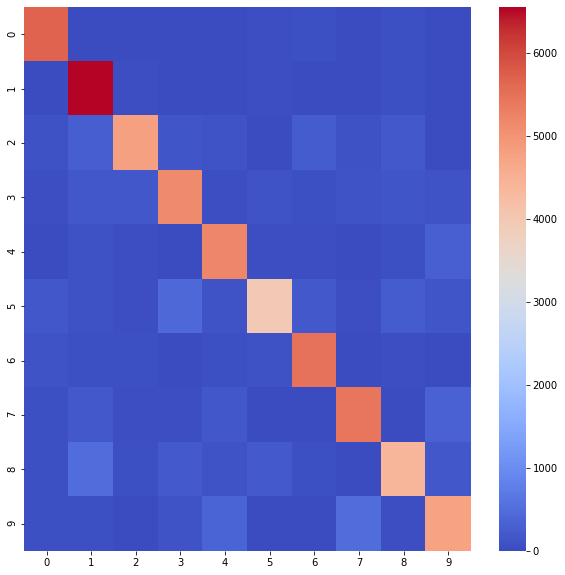

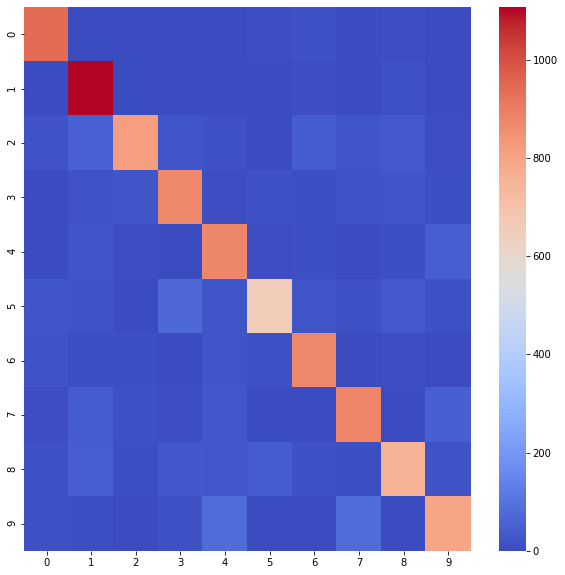

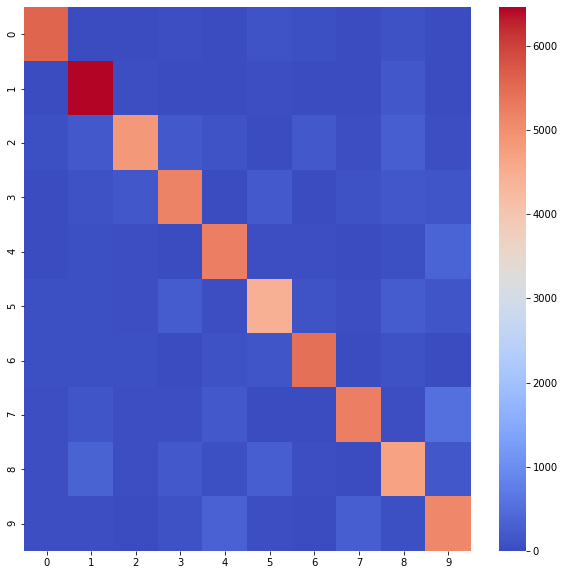

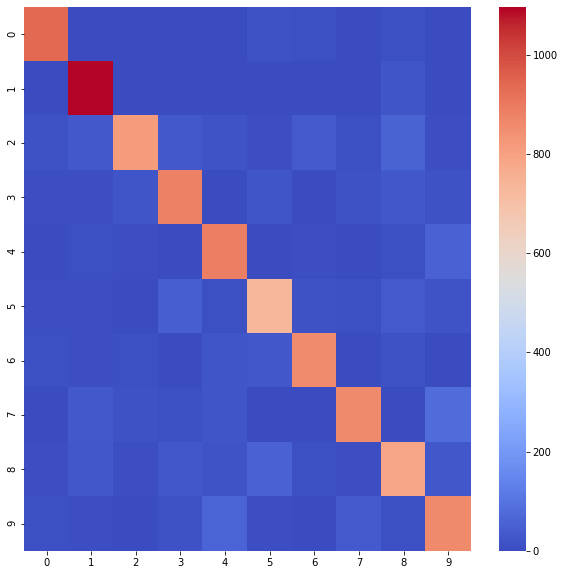

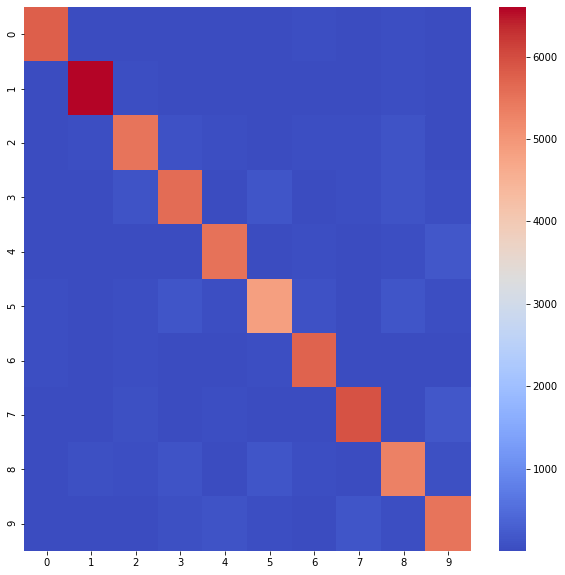

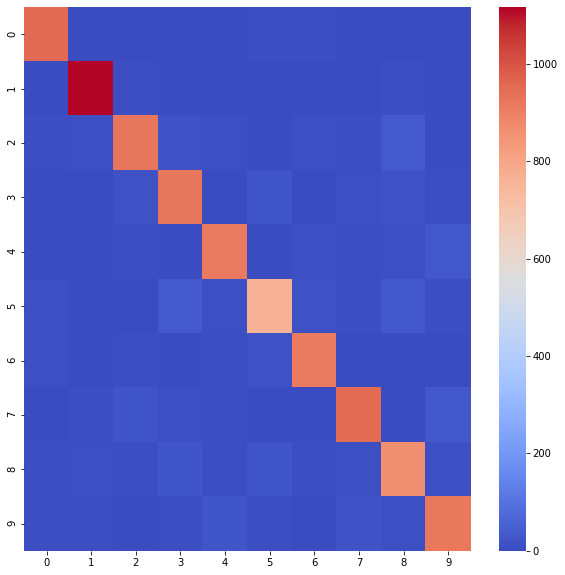

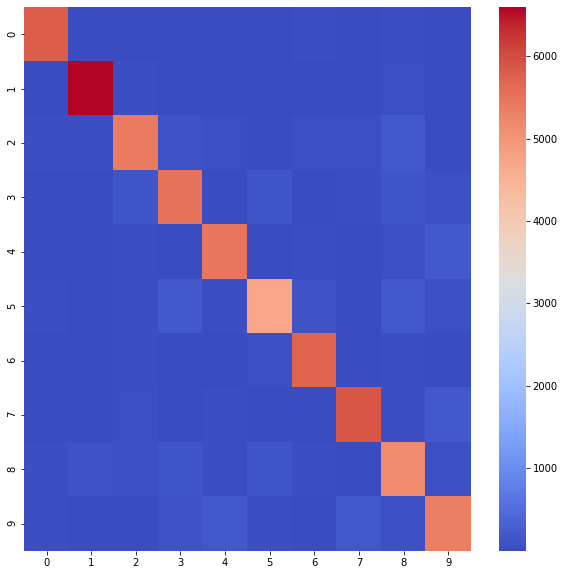

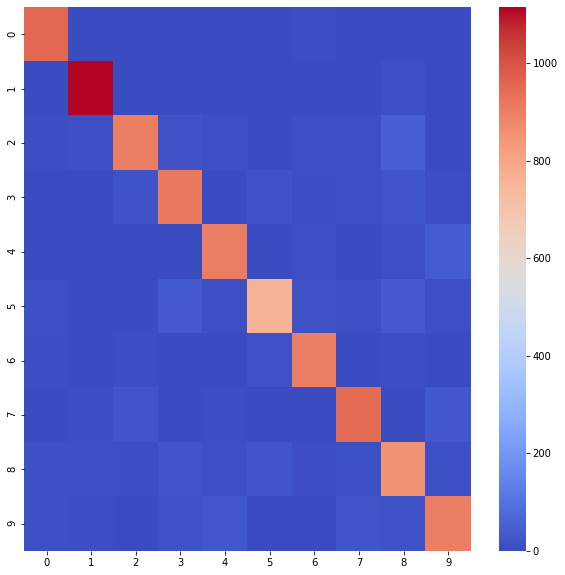

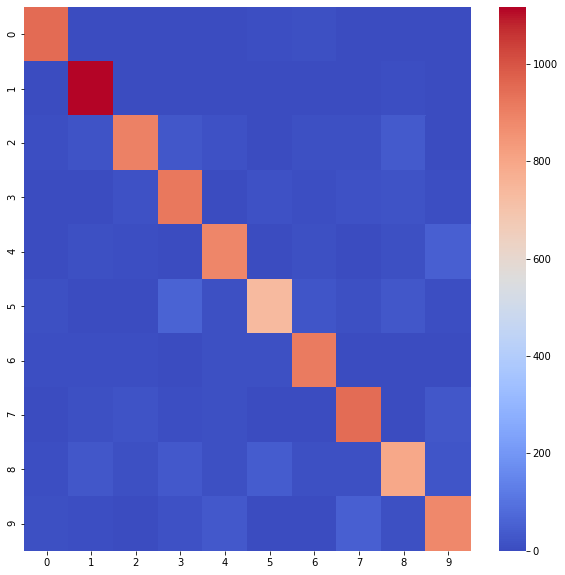

In [31]:
def main():
    # load dataset mnist 
    (X_train, y_train), (X_test, y_test) = mnist.load_data()
    n_train, img_weight_train, _ = X_train.shape
    n_test, img_weight_test, _ = X_test.shape
    
    X_train = X_train.reshape(n_train, img_weight_train**2)
    X_test = X_test.reshape(n_test, img_weight_test**2)
    
    # baseline
    print("Clasiffication baseline")
    predict_baseline = clasification_baseline(X_train, y_train, X_test, y_test)
    
    print("Clasiffication using LDA")
    predict_lda = LDA_clasification(X_train, y_train, X_test, y_test)
    
    print("Clasiffication using QDA")
    predict_qda = QDA_clasification(X_train, y_train, X_test, y_test)
    
    print("Clasiffication using LogRegresion")
    predict_log_m, predict_log_ovr = log_regression_clasification(X_train, y_train, X_test, y_test)
    
    
    new = pd.DataFrame({"y_1":predict_baseline,"y_2":predict_lda, "y_3":predict_log_m,
                       "y_4":predict_log_ovr})
    new["predict_final"] = new.apply(lambda x: x.value_counts().reset_index()["index"][0],axis=1)
    
    
    metrics_error(y_test, new["predict_final"].tolist())
if __name__ == "__main__":
    main()

### Datos Estandarizados.

Clasiffication using LDA
----------Errors train------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

           0       0.95      0.94      0.95      5923
           1       0.87      0.96      0.91      6742
           2       0.92      0.82      0.86      5958
           3       0.86      0.85      0.86      6131
           4       0.86      0.90      0.88      5842
           5       0.83      0.82      0.83      5421
           6       0.93      0.92      0.92      5918
           7       0.92      0.84      0.88      6265
           8       0.81      0.80      0.80      5851
           9       0.78      0.86      0.82      5949

    accuracy                           0.87     60000
   macro avg       0.87      0.87      0.87     60000
weighted avg       0.87      0.87      0.87     60000

----------Errors test------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

        

/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:808: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


----------Errors train------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

           0       0.37      0.97      0.53      5923
           1       0.89      0.95      0.92      6742
           2       0.89      0.27      0.42      5958
           3       0.74      0.32      0.45      6131
           4       0.91      0.18      0.30      5842
           5       0.93      0.17      0.28      5421
           6       0.69      0.97      0.81      5918
           7       0.95      0.43      0.59      6265
           8       0.49      0.63      0.55      5851
           9       0.48      0.97      0.65      5949

    accuracy                           0.59     60000
   macro avg       0.73      0.59      0.55     60000
weighted avg       0.74      0.59      0.56     60000

----------Errors test------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

           0       0.34      0.95

/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


----------Errors train------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

           0       0.96      0.97      0.97      5923
           1       0.94      0.97      0.96      6742
           2       0.94      0.91      0.93      5958
           3       0.92      0.90      0.91      6131
           4       0.93      0.94      0.93      5842
           5       0.91      0.89      0.90      5421
           6       0.95      0.96      0.96      5918
           7       0.94      0.94      0.94      6265
           8       0.91      0.88      0.89      5851
           9       0.91      0.91      0.91      5949

    accuracy                           0.93     60000
   macro avg       0.93      0.93      0.93     60000
weighted avg       0.93      0.93      0.93     60000

----------Errors test------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

           0       0.95      0.98

/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning: The ma

----------Errors train------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

           0       0.95      0.97      0.96      5923
           1       0.91      0.97      0.94      6742
           2       0.93      0.89      0.91      5958
           3       0.91      0.88      0.89      6131
           4       0.90      0.93      0.91      5842
           5       0.90      0.87      0.88      5421
           6       0.94      0.95      0.94      5918
           7       0.92      0.92      0.92      6265
           8       0.89      0.84      0.87      5851
           9       0.89      0.87      0.88      5949

    accuracy                           0.91     60000
   macro avg       0.91      0.91      0.91     60000
weighted avg       0.91      0.91      0.91     60000

----------Errors test------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

           0       0.94      0.98

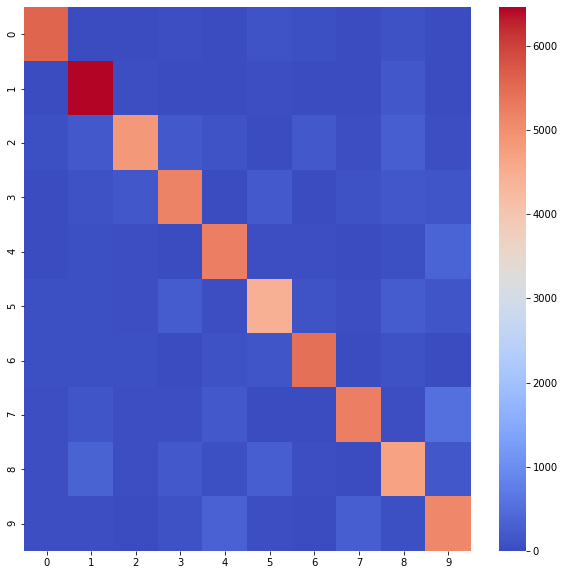

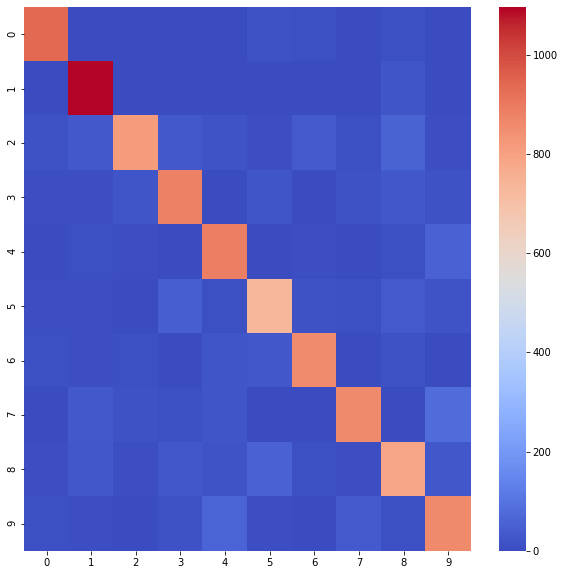

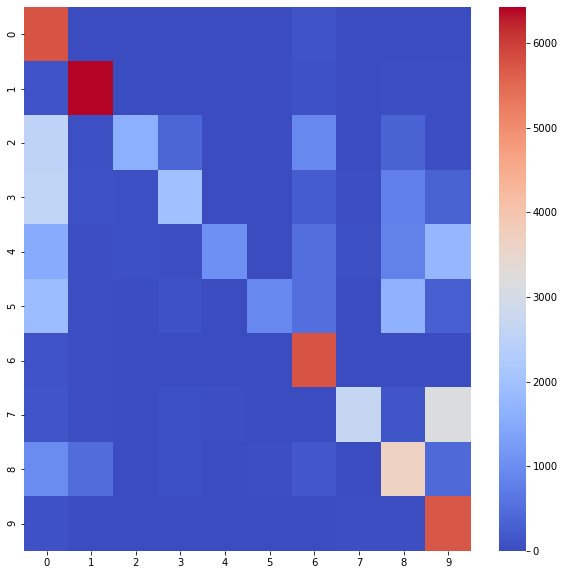

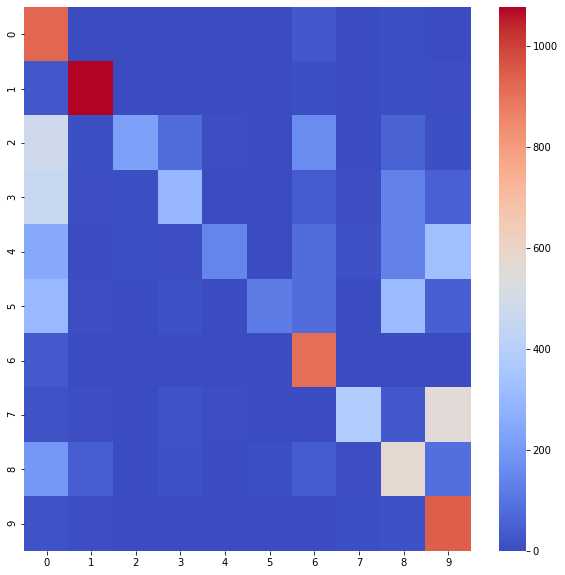

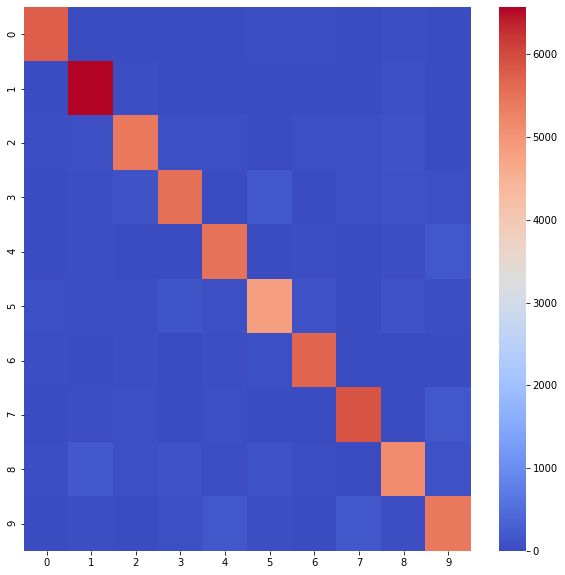

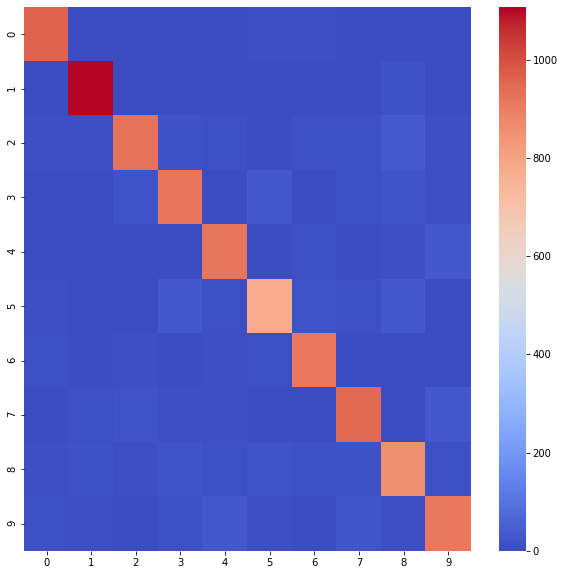

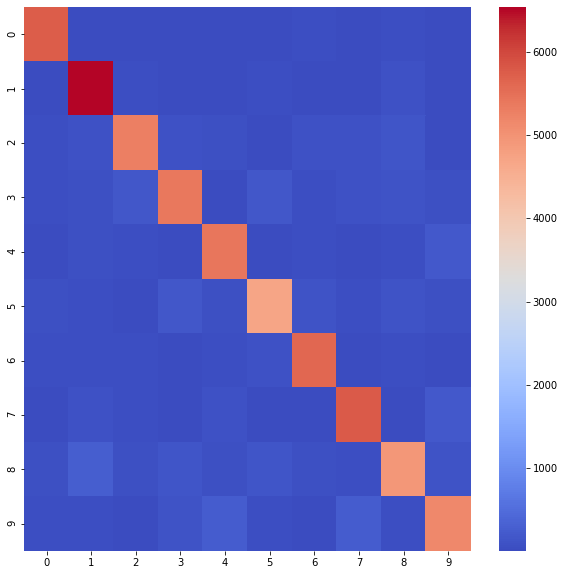

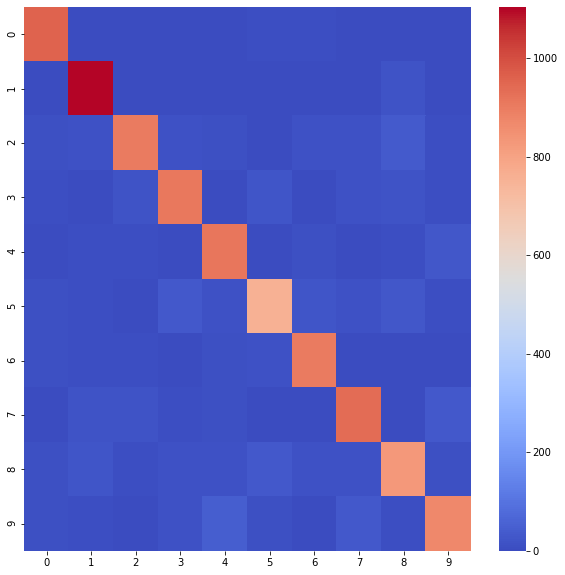

In [37]:
def main():
    # load dataset mnist 
    (X_train, y_train), (X_test, y_test) = mnist.load_data()
    n_train, img_weight_train, _ = X_train.shape
    n_test, img_weight_test, _ = X_test.shape
    
    X_train = X_train.reshape(n_train, img_weight_train**2)
    X_test = X_test.reshape(n_test, img_weight_test**2)
    
    scaler = StandardScaler(with_mean=True, with_std=True)
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
      
    print("Clasiffication using LDA")
    predict_lda = LDA_clasification(X_train, y_train, X_test, y_test)
    
    print("Clasiffication using QDA")
    predict_qda = QDA_clasification(X_train, y_train, X_test, y_test)
    
    print("Clasiffication using LogRegresion")
    predict_log_m, predict_log_ovr = log_regression_clasification(X_train, y_train, X_test, y_test)
    
if __name__ == "__main__":
    main()

### Reducción de dimensionalidad

Clasiffication using LDA
----------Errors train------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

           0       0.95      0.94      0.94      5923
           1       0.87      0.96      0.91      6742
           2       0.91      0.82      0.86      5958
           3       0.86      0.84      0.85      6131
           4       0.86      0.89      0.88      5842
           5       0.82      0.81      0.82      5421
           6       0.92      0.92      0.92      5918
           7       0.92      0.84      0.88      6265
           8       0.80      0.79      0.80      5851
           9       0.79      0.87      0.82      5949

    accuracy                           0.87     60000
   macro avg       0.87      0.87      0.87     60000
weighted avg       0.87      0.87      0.87     60000

----------Errors test------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

        

/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


----------Errors train------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

           0       0.97      0.98      0.97      5923
           1       0.97      0.98      0.97      6742
           2       0.94      0.92      0.93      5958
           3       0.92      0.92      0.92      6131
           4       0.95      0.95      0.95      5842
           5       0.92      0.90      0.91      5421
           6       0.96      0.97      0.96      5918
           7       0.95      0.95      0.95      6265
           8       0.90      0.91      0.90      5851
           9       0.92      0.92      0.92      5949

    accuracy                           0.94     60000
   macro avg       0.94      0.94      0.94     60000
weighted avg       0.94      0.94      0.94     60000

----------Errors test------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

           0       0.95      0.98

/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning: The ma

----------Errors train------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

           0       0.96      0.98      0.97      5923
           1       0.96      0.98      0.97      6742
           2       0.93      0.91      0.92      5958
           3       0.91      0.90      0.90      6131
           4       0.93      0.94      0.93      5842
           5       0.91      0.87      0.89      5421
           6       0.95      0.96      0.96      5918
           7       0.94      0.94      0.94      6265
           8       0.86      0.88      0.87      5851
           9       0.90      0.90      0.90      5949

    accuracy                           0.93     60000
   macro avg       0.93      0.93      0.93     60000
weighted avg       0.93      0.93      0.93     60000

----------Errors test------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

           0       0.95      0.98

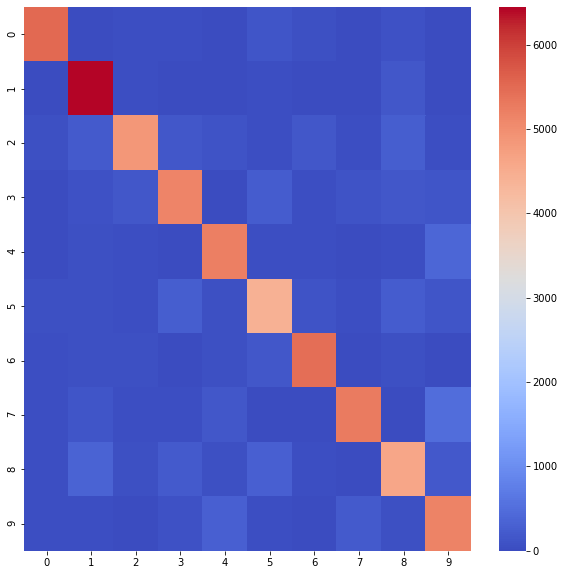

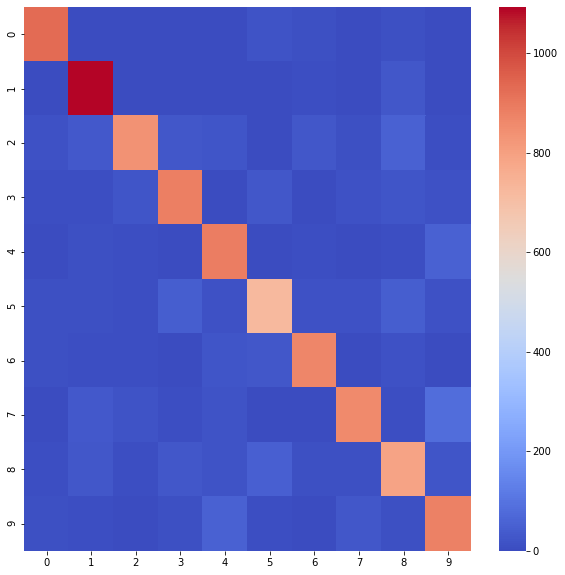

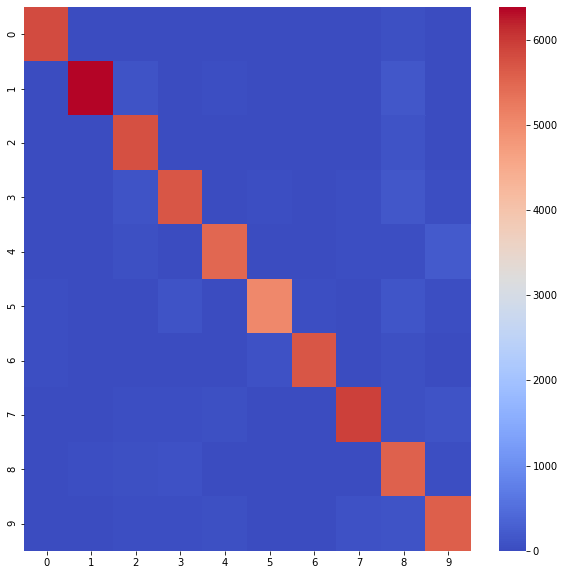

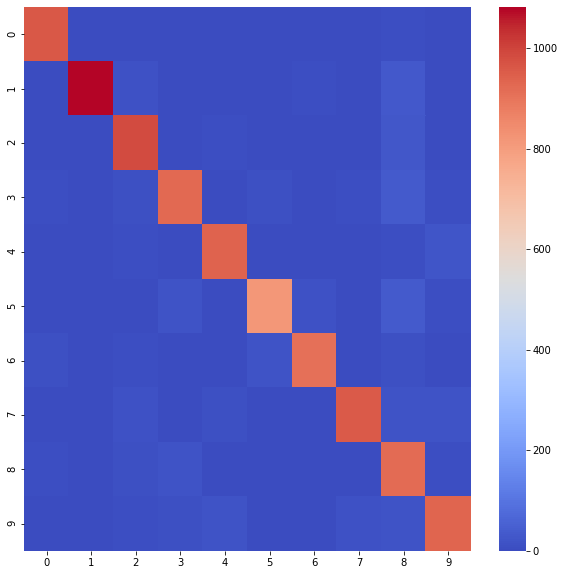

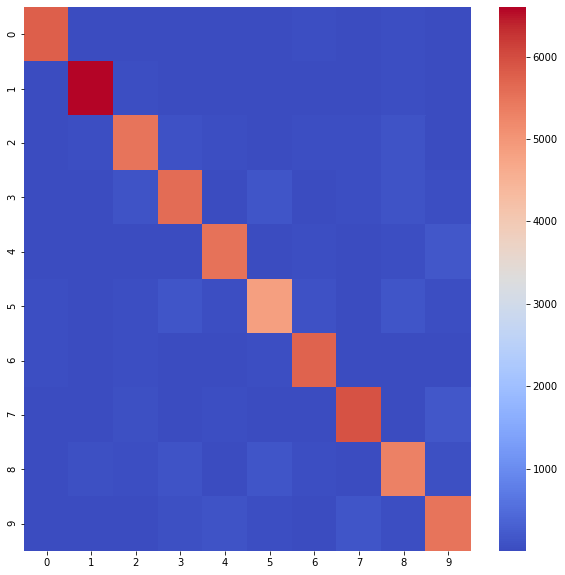

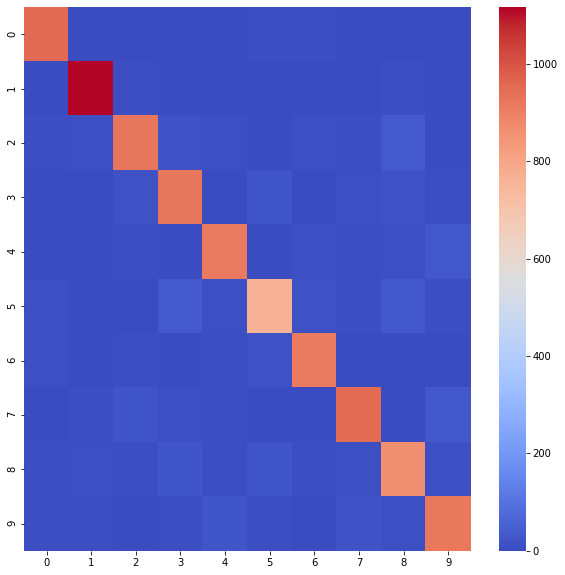

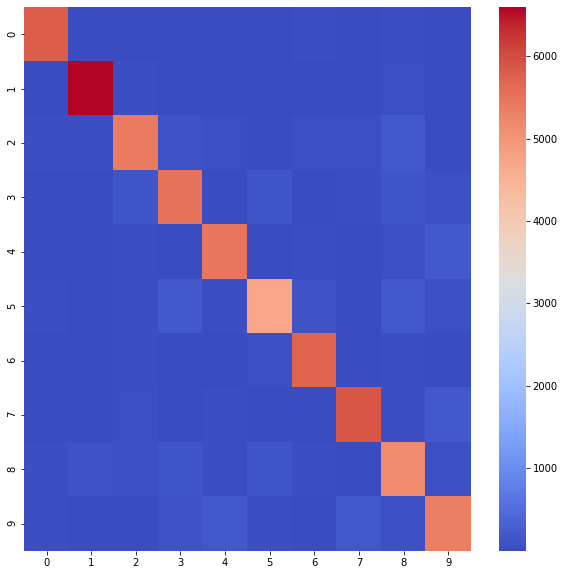

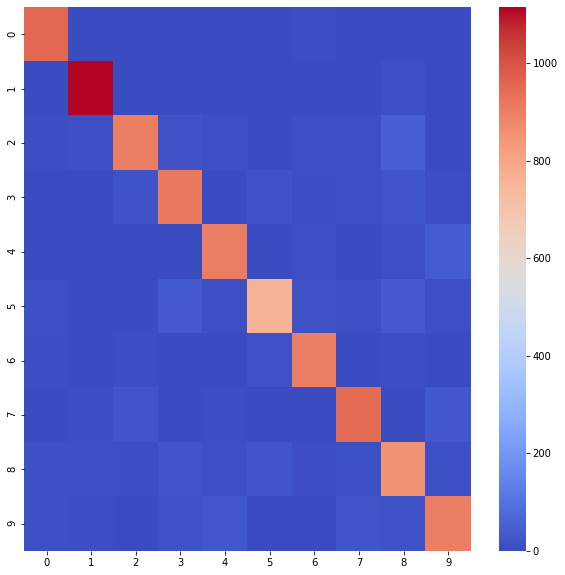

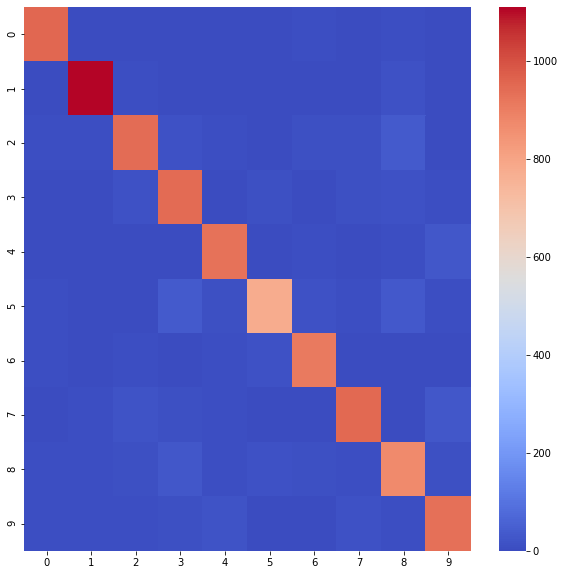

In [65]:
def main():
    # load dataset mnist 
    (X_train, y_train), (X_test, y_test) = mnist.load_data()
    n_train, img_weight_train, _ = X_train.shape
    n_test, img_weight_test, _ = X_test.shape
    
    X_train = X_train.reshape(n_train, img_weight_train**2)
    X_test = X_test.reshape(n_test, img_weight_test**2)
    
    pca = PCA(n_components=200, random_state=19970808, svd_solver="full") #
    X_pca_train = pca.fit_transform(X_train)
    X_pca_test = pca.transform(X_test)
      
    print("Clasiffication using LDA")
    predict_lda = LDA_clasification(X_pca_train, y_train, X_pca_test, y_test)
    
    print("Clasiffication using QDA")
    predict_qda = QDA_clasification(X_pca_train, y_train, X_pca_test, y_test)
    
    print("Clasiffication using LogRegresion")
    predict_log_m, predict_log_ovr = log_regression_clasification(X_train, y_train, X_test, y_test)
    
    new = pd.DataFrame({"y_1":predict_qda, "y_2":predict_lda, "y_3":predict_log_m})
    new["predict_final"] = new.apply(lambda x: x.value_counts().reset_index()["index"][0],axis=1)
    
    
    metrics_error(y_test, new["predict_final"].tolist())
    
if __name__ == "__main__":
    main()

## Análisis de textos y de sentimientos

In [4]:
import glob, os, sys
import numpy as np
import pandas as pd




from my_functions import * 

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity


[nltk_data] Error loading punkt: <urlopen error [Errno -3] Temporary
[nltk_data]     failure in name resolution>
[nltk_data] Error loading stopwords: <urlopen error [Errno -3]
[nltk_data]     Temporary failure in name resolution>


In [5]:
path_reviews = glob.glob("data/spanish_reviews/all_files/*.txt")
path_reviews.sort()

reviews = pd.read_csv("data/spanish_reviews/reviews_text_caract.csv")

In [6]:
sentimiento = reviews["sentimiento"].tolist()

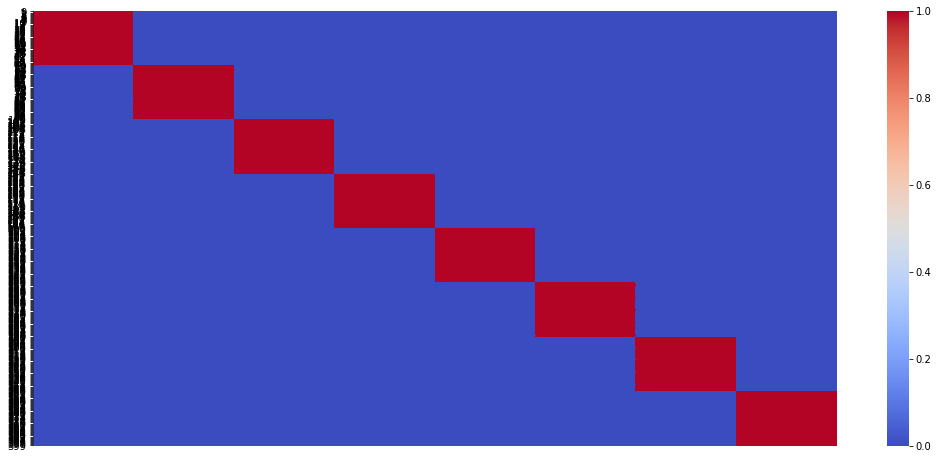

In [7]:
productos = reviews["categoria"].tolist()

vectorizer = CountVectorizer(lowercase=True, ngram_range= (1,1), binary=False, max_features=10000)
X = vectorizer.fit_transform(productos)
bow = X.toarray()
bow_df = pd.DataFrame(bow,columns=vectorizer.get_feature_names())

cos_sim = cosine_similarity(bow, bow)
sim_df = pd.DataFrame(cos_sim)


fig, axs = plt.subplots( figsize=(18,8))
hm = sns.heatmap(sim_df, annot=False, cmap="coolwarm", xticklabels = False,
                     yticklabels = True)

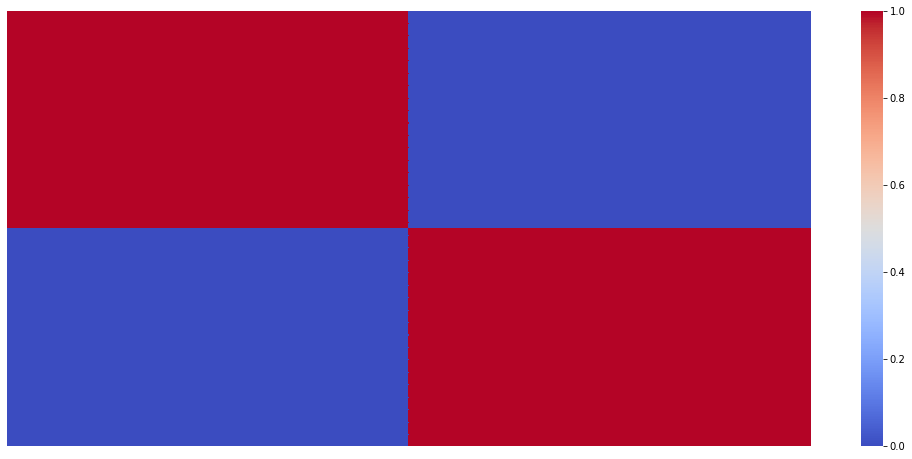

In [8]:
sentimiento = reviews["sentimiento"].tolist()
reviews_no_index = reviews[reviews["sentimiento"]=="no"].index.tolist()
reviews_yes_index = reviews[reviews["sentimiento"]=="yes"].index.tolist()

corpus_sort_reviews_no = [sentimiento[i] for i in reviews_no_index]
corpus_sort_reviews_yes = [sentimiento[i] for i in reviews_yes_index]


sentimiento = corpus_sort_reviews_no+corpus_sort_reviews_yes
vectorizer = CountVectorizer(lowercase=True, ngram_range= (1,1), binary=False, max_features=10000)
X = vectorizer.fit_transform(sentimiento)
bow = X.toarray()
bow_df = pd.DataFrame(bow,columns=vectorizer.get_feature_names())

cos_sim = cosine_similarity(bow, bow)
sim_df = pd.DataFrame(cos_sim)


fig, axs = plt.subplots( figsize=(18,8))
hm = sns.heatmap(sim_df, annot=False, cmap="coolwarm", xticklabels = False,
                     yticklabels = False)

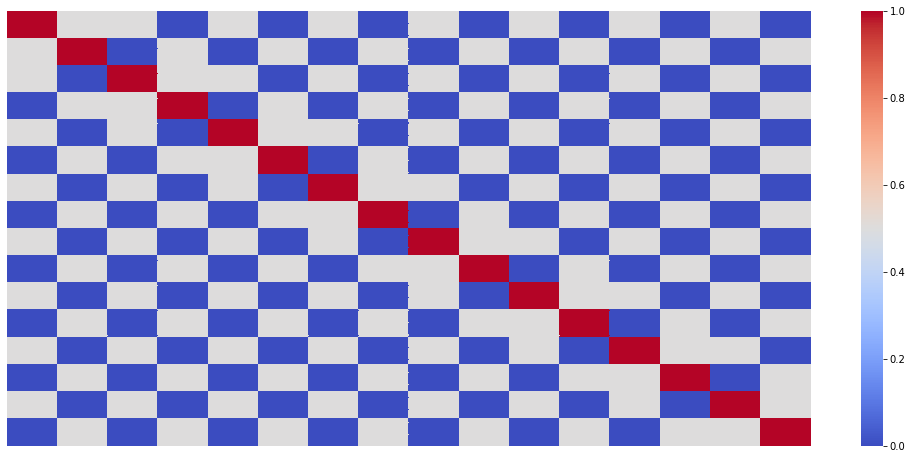

In [9]:
reviews["new"] = reviews["categoria"] +" " +reviews["sentimiento"]

reviews_value = reviews.sort_values(["categoria", "sentimiento"])["new"].tolist()
vectorizer = CountVectorizer(lowercase=True, ngram_range= (1,1), binary=False, max_features=10000)
X = vectorizer.fit_transform(reviews_value)
bow = X.toarray()
bow_df = pd.DataFrame(bow,columns=vectorizer.get_feature_names())

cos_sim = cosine_similarity(bow, bow)
sim_df = pd.DataFrame(cos_sim)


fig, axs = plt.subplots( figsize=(18,8))
hm = sns.heatmap(sim_df, annot=False, cmap="coolwarm", xticklabels = False,
                     yticklabels = False)

### Sin Stemming y ni lematiza

In [10]:
corpus = []
for i in range(400):
    corpus.append(open(path_reviews[i], "r", encoding="latin-1").read())
    corpus[i] = corpus[i].replace("\n", " ")\
    .replace("\x80", " ")\
    .replace("º", "")

In [67]:
preprocesador = preprocesaTexto(idioma='es', _tokeniza=False, _muestraCambios=False, _quitarAcentos=True,
                                _quitarNumeros=False, _remueveStop=False, _stemming=False, _lematiza=False,
                                _removerPuntuacion=True)

corpus_prep1 = []
for i in range(400):
    corpus_prep1.append(preprocesador.preprocesa(corpus[i]))

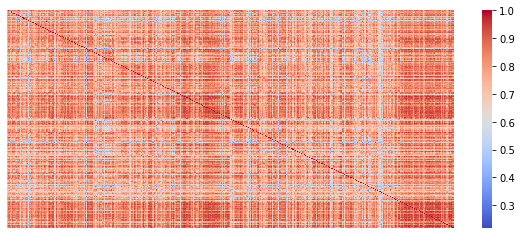

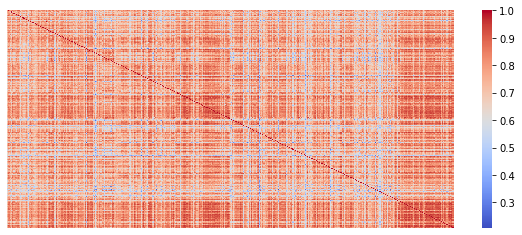

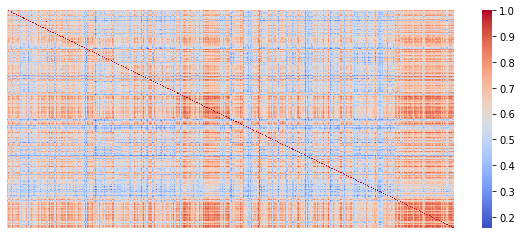

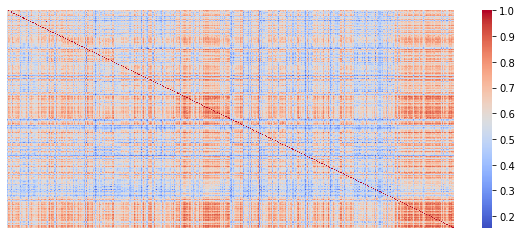

In [70]:
for i in [50, 100, 4000, 6000]:
    vectorizer = CountVectorizer(lowercase=True, ngram_range= (1,2), binary=False, max_features=i)
    X = vectorizer.fit_transform(corpus_prep1)
    bow = X.toarray()
    bow_df = pd.DataFrame(bow,columns=vectorizer.get_feature_names())

    cos_sim = cosine_similarity(bow, bow)
    sim_df = pd.DataFrame(cos_sim)


    fig, axs = plt.subplots( figsize=(10,4))
    hm = sns.heatmap(sim_df, annot=False, cmap="coolwarm", xticklabels = False,
                     yticklabels = False)

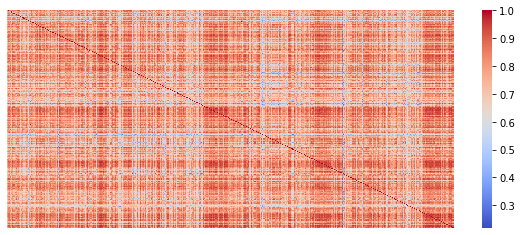

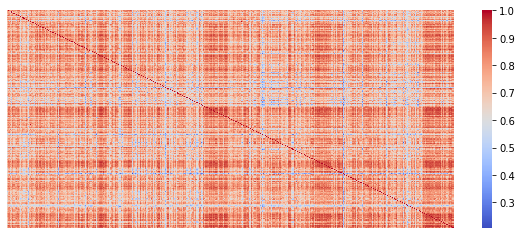

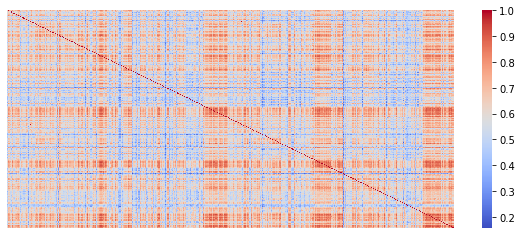

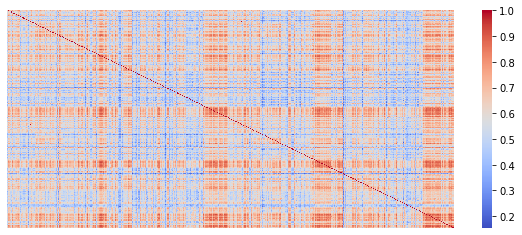

In [72]:
sentimiento = reviews["sentimiento"].tolist()
reviews_no_index = reviews[reviews["sentimiento"]=="no"].index.tolist()
reviews_yes_index = reviews[reviews["sentimiento"]=="yes"].index.tolist()


corpus_sort_reviews_no = [corpus_prep1[i] for i in reviews_no_index]
corpus_sort_reviews_yes = [corpus_prep1[i] for i in reviews_yes_index]

corpus_prep_new1 = corpus_sort_reviews_no+corpus_sort_reviews_yes
for i in [50, 100, 4000, 6000]:
    vectorizer = CountVectorizer(lowercase=True, ngram_range= (1,2), binary=False, max_features=i)
    X = vectorizer.fit_transform(corpus_prep_new1)
    bow = X.toarray()
    bow_df = pd.DataFrame(bow,columns=vectorizer.get_feature_names())

    cos_sim = cosine_similarity(bow, bow)
    sim_df = pd.DataFrame(cos_sim)


    fig, axs = plt.subplots( figsize=(10,4))
    hm = sns.heatmap(sim_df, annot=False, cmap="coolwarm", xticklabels = False,
                     yticklabels = False)

### Stemming y Lematizando

In [17]:
preprocesador = preprocesaTexto(idioma='es', _tokeniza=False, _muestraCambios=False, _quitarAcentos=True,
                                _quitarNumeros=False, _remueveStop=True, _stemming=True, _lematiza=True,
                                _removerPuntuacion=True)

In [18]:
corpus_prep2 = []
for i in range(400):
    corpus_prep2.append(preprocesador.preprocesa(corpus[i]))

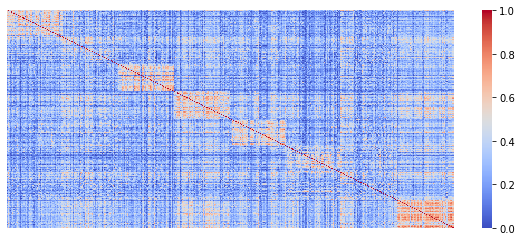

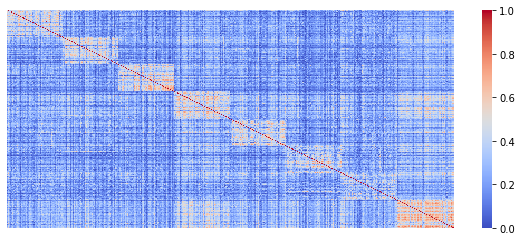

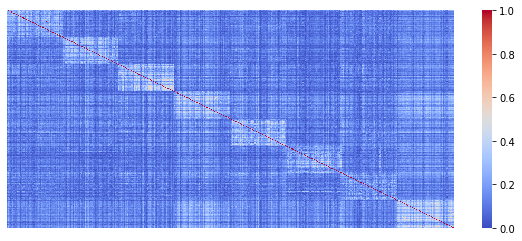

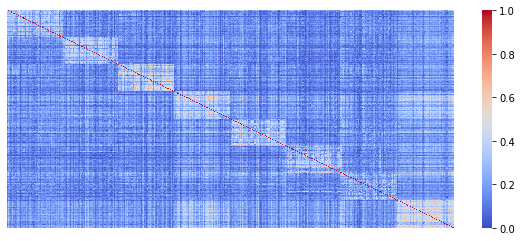

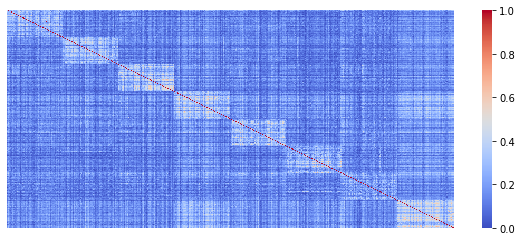

In [19]:
for i in [50, 100, 3000, 500, 1000]:
    vectorizer = CountVectorizer(lowercase=True, ngram_range= (1,2), binary=False, max_features=i)
    X = vectorizer.fit_transform(corpus_prep2)
    bow = X.toarray()
    bow_df = pd.DataFrame(bow,columns=vectorizer.get_feature_names())

    cos_sim = cosine_similarity(bow, bow)
    sim_df = pd.DataFrame(cos_sim)


    fig, axs = plt.subplots(figsize=(10,4))
    hm = sns.heatmap(sim_df, annot=False, cmap="coolwarm", xticklabels = False,
                     yticklabels = False)

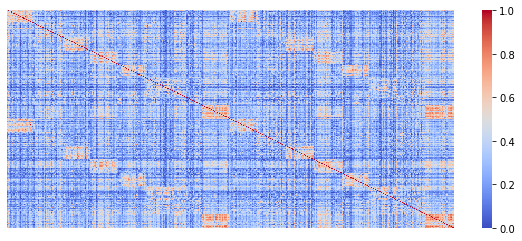

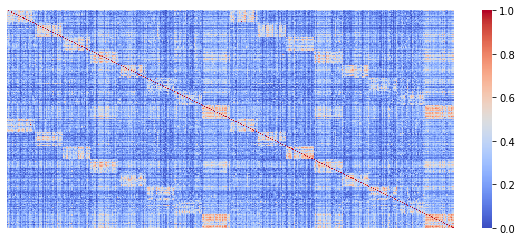

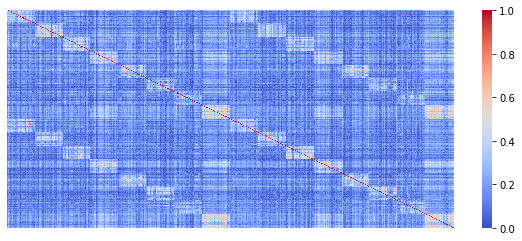

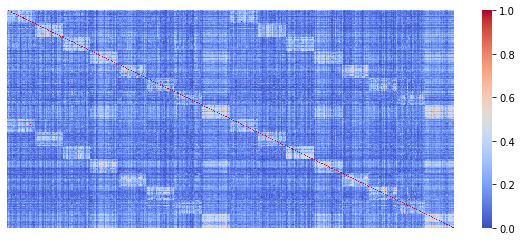

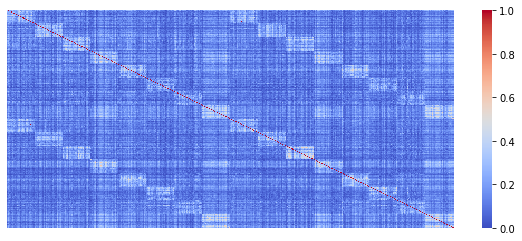

In [20]:
sentimiento = reviews["sentimiento"].tolist()
reviews_no_index = reviews[reviews["sentimiento"]=="no"].index.tolist()
reviews_yes_index = reviews[reviews["sentimiento"]=="yes"].index.tolist()

corpus_sort_reviews_no = [corpus_prep2[i] for i in reviews_no_index]
corpus_sort_reviews_yes = [corpus_prep2[i] for i in reviews_yes_index]

corpus_prep22 = corpus_sort_reviews_no+corpus_sort_reviews_yes
for i in [50, 100, 500, 1000, 3000]:
    vectorizer = CountVectorizer(lowercase=True, ngram_range= (1,2), binary=False, max_features=i)
    X = vectorizer.fit_transform(corpus_prep22)
    bow = X.toarray()
    bow_df = pd.DataFrame(bow,columns=vectorizer.get_feature_names())

    cos_sim = cosine_similarity(bow, bow)
    sim_df = pd.DataFrame(cos_sim)


    fig, axs = plt.subplots( figsize=(10,4))
    hm = sns.heatmap(sim_df, annot=False, cmap="coolwarm", xticklabels = False,
                     yticklabels = False)

### Lo anterior y quitando números

In [12]:
preprocesador = preprocesaTexto(idioma='es', _tokeniza=False, _muestraCambios=False, _quitarAcentos=True,
                                _quitarNumeros=True, _remueveStop=True, _stemming=True, _lematiza=True,
                                _removerPuntuacion=True)

In [13]:
corpus_prep3 = []
for i in range(400):
    corpus_prep3.append(preprocesador.preprocesa(corpus[i]))

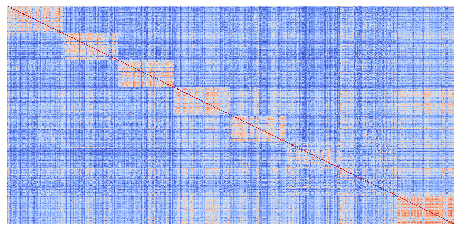

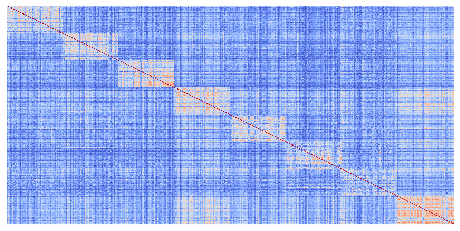

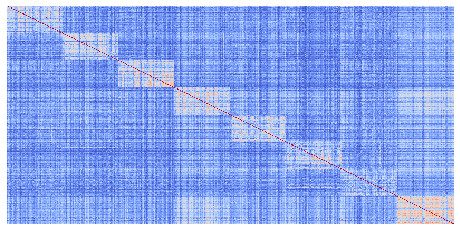

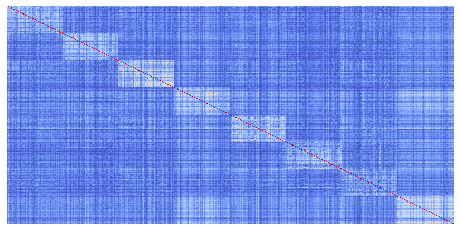

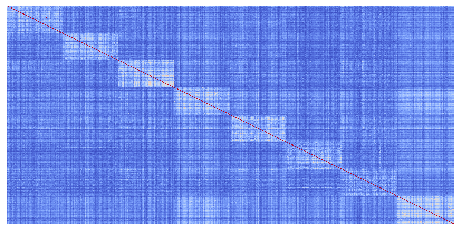

In [13]:
for i in [50, 100, 200, 2000, 3000]:
    vectorizer = CountVectorizer(lowercase=True, ngram_range= (1,1), binary=False, max_features=i)
    X = vectorizer.fit_transform(corpus_prep3)
    bow = X.toarray()
    bow_df = pd.DataFrame(bow,columns=vectorizer.get_feature_names())

    cos_sim = cosine_similarity(bow, bow)
    sim_df = pd.DataFrame(cos_sim)


    fig, axs = plt.subplots( figsize=(8,4))
    hm = sns.heatmap(sim_df, annot=False, cmap="coolwarm", xticklabels = False,
                     yticklabels = False, cbar=False)

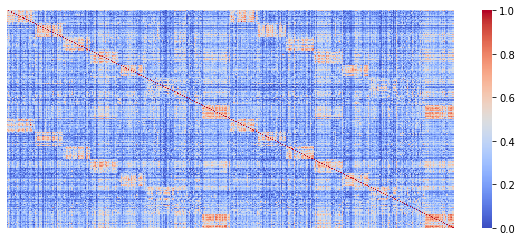

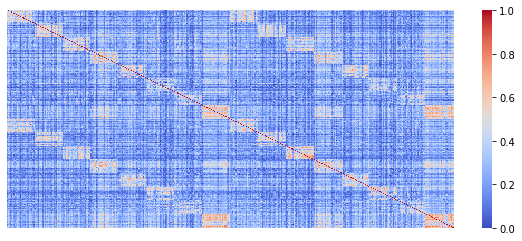

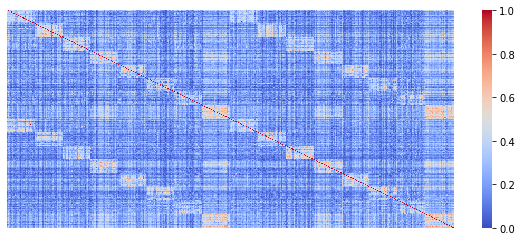

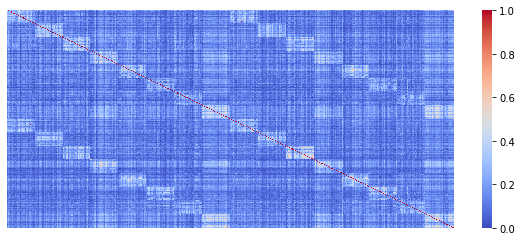

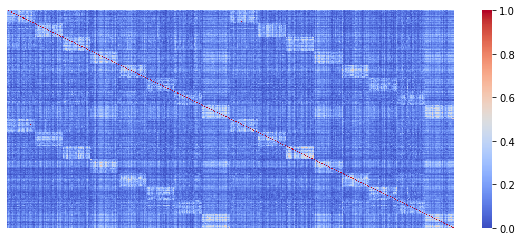

In [14]:
sentimiento = reviews["sentimiento"].tolist()
reviews_no_index = reviews[reviews["sentimiento"]=="no"].index.tolist()
reviews_yes_index = reviews[reviews["sentimiento"]=="yes"].index.tolist()

corpus_sort_reviews_no = [corpus_prep3[i] for i in reviews_no_index]
corpus_sort_reviews_yes = [corpus_prep3[i] for i in reviews_yes_index]

producto_prep_no = [productos[i] for i in reviews_no_index]
producto_prep_yes = [productos[i] for i in reviews_yes_index]
producto_prep = producto_prep_no+producto_prep_yes


corpus_prep33 = corpus_sort_reviews_no+corpus_sort_reviews_yes
for i in [50, 100, 200, 2000, 3000]:
    vectorizer = CountVectorizer(lowercase=True, ngram_range= (1,2), binary=False, max_features=i)
    X = vectorizer.fit_transform(corpus_prep33)
    bow = X.toarray()
    bow_df = pd.DataFrame(bow,columns=vectorizer.get_feature_names())

    cos_sim = cosine_similarity(bow, bow)
    sim_df = pd.DataFrame(cos_sim)


    fig, axs = plt.subplots( figsize=(10,4))
    hm = sns.heatmap(sim_df, annot=False, cmap="coolwarm", xticklabels = False,
                     yticklabels = False)

### c)

In [73]:
vectorizer = CountVectorizer(lowercase=True, ngram_range= (1,1), binary=False, max_features=7000)
corpus_sort_reviews_no = [corpus_prep1[i] for i in reviews_no_index]
corpus_sort_reviews_yes = [corpus_prep1[i] for i in reviews_yes_index]
corpus_prep33 = corpus_sort_reviews_no+corpus_sort_reviews_yes

producto_prep_no = [productos[i] for i in reviews_no_index]
producto_prep_yes = [productos[i] for i in reviews_yes_index]
producto_prep = producto_prep_no+producto_prep_yes


X = vectorizer.fit_transform(corpus_prep33)
bow = X.toarray()
bow_df = pd.DataFrame(bow,columns=vectorizer.get_feature_names())
cos_sim = cosine_similarity(bow, bow)
sim_df = pd.DataFrame(cos_sim)

## Representacion en 2d

In [52]:
number_state = 19970808

In [53]:
y_tag = np.repeat("no", 200)
y_tag = np.concatenate([y_tag,np.repeat("yes", 200)])

new_tag = []
for i in range(400):
    new_tag.append("{}_{}".format(y_tag[i], producto_prep[i]))



/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.002s...
[t-SNE] Computed neighbors for 400 samples in 0.005s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 59.437344


KeyboardInterrupt: 

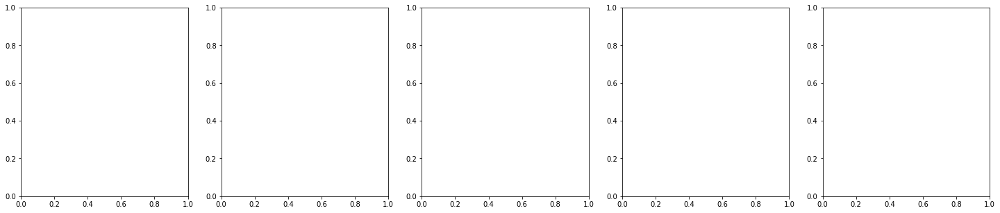

In [49]:
perplexity = [5, 10, 20, 40, 60]
learning_rate = [20., 90., 150., 200.0, 300.]
verbose = [1]
for j in verbose:
  for k in learning_rate:
    fig, axs = plt.subplots(ncols=5, figsize=(25,5))
    for i in [0, 1, 2, 3, 4]:
      tsne = TSNE(n_components=2, perplexity=perplexity[i], verbose=j, random_state=number_state, learning_rate=k, 
                 n_jobs=-1, metric="precomputed")
      z_tsne = tsne.fit_transform(sim_df)
      z_tsne = pd.DataFrame({"x_tsne":z_tsne[:,0], "y_tsne":z_tsne[:,1]})

      sns.scatterplot(ax=axs[i], x=z_tsne.iloc[:,0], y=z_tsne.iloc[:,1], legend=False, size=0.7, 
                      hue=y_tag, palette="tab10")
    print("Verbose is ", str(j), ", learning rate ", str(k), ".")
    plt.show()

/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.002s...
[t-SNE] Computed neighbors for 400 samples in 0.006s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 88.513290
[t-SNE] KL divergence after 1000 iterations: 2.755820
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.009s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.000000


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] KL divergence after 250 iterations with early exaggeration: 79.350624
[t-SNE] KL divergence after 1000 iterations: 2.699057
[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.002s...
[t-SNE] Computed neighbors for 400 samples in 0.011s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.097280


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] KL divergence after 250 iterations with early exaggeration: 61.749115
[t-SNE] KL divergence after 1000 iterations: 2.240785
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.014s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.115476


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] KL divergence after 250 iterations with early exaggeration: 52.535625
[t-SNE] KL divergence after 1000 iterations: 1.695259
[t-SNE] Computing 181 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.018s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.127448


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] KL divergence after 250 iterations with early exaggeration: 48.307709
[t-SNE] KL divergence after 1000 iterations: 1.377541
Verbose is  1 , learning rate  20.0 .


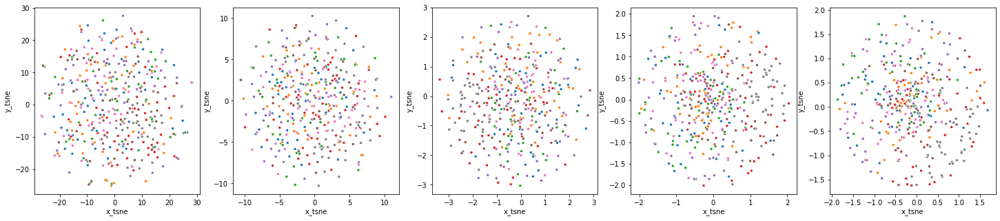

/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.002s...
[t-SNE] Computed neighbors for 400 samples in 0.007s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 113.061821
[t-SNE] KL divergence after 1000 iterations: 2.879645
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.002s...
[t-SNE] Computed neighbors for 400 samples in 0.008s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.000000


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] KL divergence after 250 iterations with early exaggeration: 110.881714
[t-SNE] KL divergence after 1000 iterations: 2.703976


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.013s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.097280
[t-SNE] KL divergence after 250 iterations with early exaggeration: 115.393753
[t-SNE] KL divergence after 1000 iterations: 2.235973
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.014s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.115476


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] KL divergence after 250 iterations with early exaggeration: 98.158607
[t-SNE] KL divergence after 1000 iterations: 1.693536
[t-SNE] Computing 181 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.002s...
[t-SNE] Computed neighbors for 400 samples in 0.021s...


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.127448
[t-SNE] KL divergence after 250 iterations with early exaggeration: 84.892929
[t-SNE] KL divergence after 1000 iterations: 1.375214
Verbose is  1 , learning rate  90.0 .


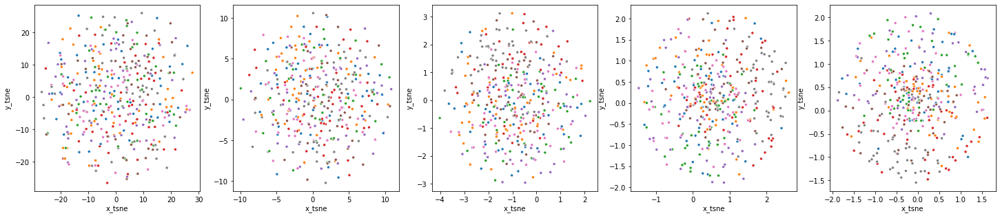

/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.006s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 111.432579
[t-SNE] KL divergence after 1000 iterations: 2.917540
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.008s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.000000


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] KL divergence after 250 iterations with early exaggeration: 120.590897
[t-SNE] KL divergence after 1000 iterations: 2.747498
[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.011s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.097280


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] KL divergence after 250 iterations with early exaggeration: 121.362823
[t-SNE] KL divergence after 1000 iterations: 2.236471
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.002s...
[t-SNE] Computed neighbors for 400 samples in 0.030s...


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.115476
[t-SNE] KL divergence after 250 iterations with early exaggeration: 112.012726
[t-SNE] KL divergence after 1000 iterations: 1.695029
[t-SNE] Computing 181 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.018s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.127448


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] KL divergence after 250 iterations with early exaggeration: 101.741615
[t-SNE] KL divergence after 1000 iterations: 1.374927
Verbose is  1 , learning rate  150.0 .


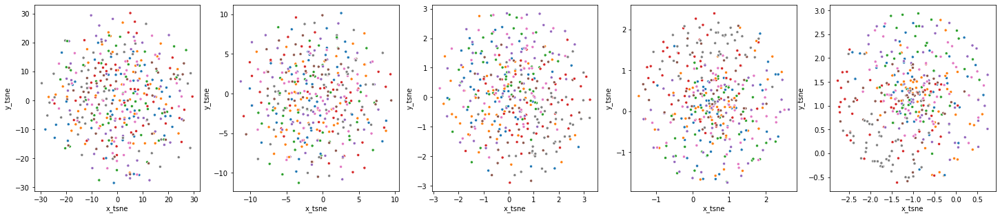

/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.002s...
[t-SNE] Computed neighbors for 400 samples in 0.008s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 115.568520
[t-SNE] KL divergence after 1000 iterations: 2.941042
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.002s...
[t-SNE] Computed neighbors for 400 samples in 0.012s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.000000


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] KL divergence after 250 iterations with early exaggeration: 120.612778
[t-SNE] KL divergence after 1000 iterations: 2.862098
[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.011s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.097280


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] KL divergence after 250 iterations with early exaggeration: 125.193008
[t-SNE] KL divergence after 1000 iterations: 2.233365
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.015s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.115476


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] KL divergence after 250 iterations with early exaggeration: 114.480225
[t-SNE] KL divergence after 1000 iterations: 1.694454
[t-SNE] Computing 181 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.018s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.127448


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] KL divergence after 250 iterations with early exaggeration: 101.892853
[t-SNE] KL divergence after 1000 iterations: 1.375543
Verbose is  1 , learning rate  200.0 .


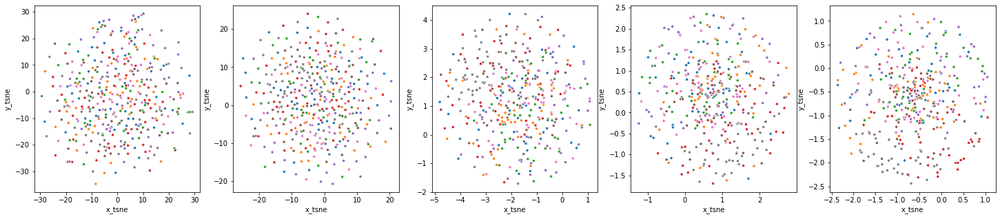

/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.012s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 116.622147
[t-SNE] KL divergence after 1000 iterations: 2.904028
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.008s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.000000


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] KL divergence after 250 iterations with early exaggeration: 125.878647
[t-SNE] KL divergence after 1000 iterations: 2.974597
[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.002s...
[t-SNE] Computed neighbors for 400 samples in 0.010s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.097280


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] KL divergence after 250 iterations with early exaggeration: 123.308517
[t-SNE] KL divergence after 1000 iterations: 2.726358
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.017s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.115476


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] KL divergence after 250 iterations with early exaggeration: 115.666870
[t-SNE] KL divergence after 1000 iterations: 1.693791
[t-SNE] Computing 181 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.018s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.127448


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] KL divergence after 250 iterations with early exaggeration: 110.910889
[t-SNE] KL divergence after 1000 iterations: 1.374885
Verbose is  1 , learning rate  300.0 .


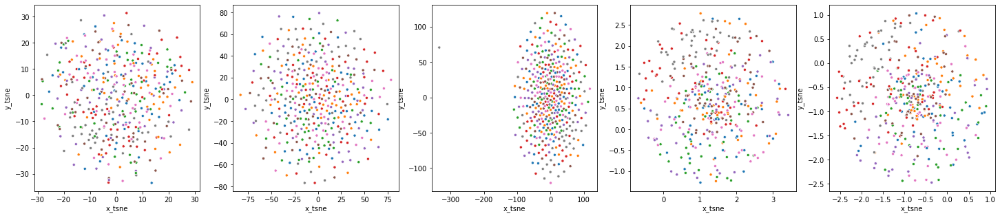

In [137]:
perplexity = [5, 10, 20, 40, 60]
learning_rate = [20., 90., 150., 200.0, 300.]
verbose = [1]
for j in verbose:
  for k in learning_rate:
    fig, axs = plt.subplots(ncols=5, figsize=(25,5))
    for i in [0, 1, 2, 3, 4]:
      tsne = TSNE(n_components=2, perplexity=perplexity[i], verbose=j, random_state=number_state, learning_rate=k, 
                 n_jobs=-1, metric="precomputed")
      z_tsne = tsne.fit_transform(sim_df)
      z_tsne = pd.DataFrame({"x_tsne":z_tsne[:,0], "y_tsne":z_tsne[:,1]})

      sns.scatterplot(ax=axs[i], x=z_tsne.iloc[:,0], y=z_tsne.iloc[:,1], legend=False, size=0.7, 
                      hue=producto_prep, palette="tab10")
    print("Verbose is ", str(j), ", learning rate ", str(k), ".")
    plt.show()

/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.007s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 88.513306
[t-SNE] KL divergence after 1000 iterations: 2.755820
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.008s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.000000


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] KL divergence after 250 iterations with early exaggeration: 79.350624
[t-SNE] KL divergence after 1000 iterations: 2.699057
[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.002s...
[t-SNE] Computed neighbors for 400 samples in 0.014s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.097280


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] KL divergence after 250 iterations with early exaggeration: 61.749115
[t-SNE] KL divergence after 1000 iterations: 2.240785
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.014s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.115476


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] KL divergence after 250 iterations with early exaggeration: 52.535629
[t-SNE] KL divergence after 1000 iterations: 1.695259
[t-SNE] Computing 181 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.003s...
[t-SNE] Computed neighbors for 400 samples in 0.026s...


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.127448
[t-SNE] KL divergence after 250 iterations with early exaggeration: 48.307709
[t-SNE] KL divergence after 1000 iterations: 1.377541
Verbose is  1 , learning rate  20.0 .


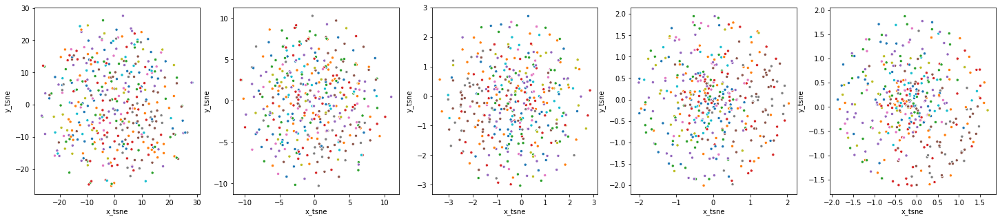

/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.003s...
[t-SNE] Computed neighbors for 400 samples in 0.008s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 113.061821
[t-SNE] KL divergence after 1000 iterations: 2.879645
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.008s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.000000


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] KL divergence after 250 iterations with early exaggeration: 110.881706
[t-SNE] KL divergence after 1000 iterations: 2.703976
[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.010s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.097280


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] KL divergence after 250 iterations with early exaggeration: 115.393753
[t-SNE] KL divergence after 1000 iterations: 2.235973
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.002s...
[t-SNE] Computed neighbors for 400 samples in 0.014s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.115476


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] KL divergence after 250 iterations with early exaggeration: 98.158607
[t-SNE] KL divergence after 1000 iterations: 1.693536
[t-SNE] Computing 181 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.002s...
[t-SNE] Computed neighbors for 400 samples in 0.018s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.127448


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] KL divergence after 250 iterations with early exaggeration: 84.892929
[t-SNE] KL divergence after 1000 iterations: 1.375214
Verbose is  1 , learning rate  90.0 .


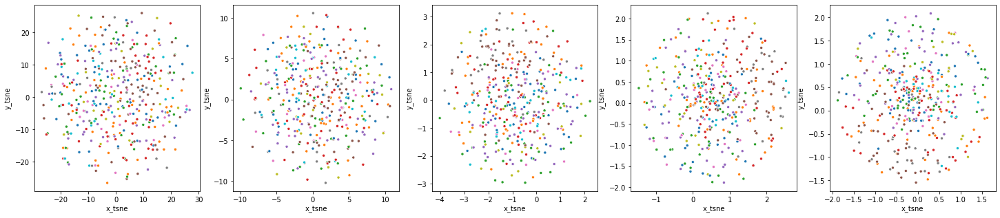

/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.008s...
[t-SNE] Computed neighbors for 400 samples in 0.011s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 111.432579
[t-SNE] KL divergence after 1000 iterations: 2.917540
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.002s...
[t-SNE] Computed neighbors for 400 samples in 0.033s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.000000


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] KL divergence after 250 iterations with early exaggeration: 120.590897
[t-SNE] KL divergence after 1000 iterations: 2.747498
[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.011s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.097280


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] KL divergence after 250 iterations with early exaggeration: 121.362823
[t-SNE] KL divergence after 1000 iterations: 2.236471
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.002s...
[t-SNE] Computed neighbors for 400 samples in 0.017s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.115476


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] KL divergence after 250 iterations with early exaggeration: 112.012726
[t-SNE] KL divergence after 1000 iterations: 1.695029
[t-SNE] Computing 181 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.002s...
[t-SNE] Computed neighbors for 400 samples in 0.018s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.127448


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] KL divergence after 250 iterations with early exaggeration: 101.741615
[t-SNE] KL divergence after 1000 iterations: 1.374927
Verbose is  1 , learning rate  150.0 .


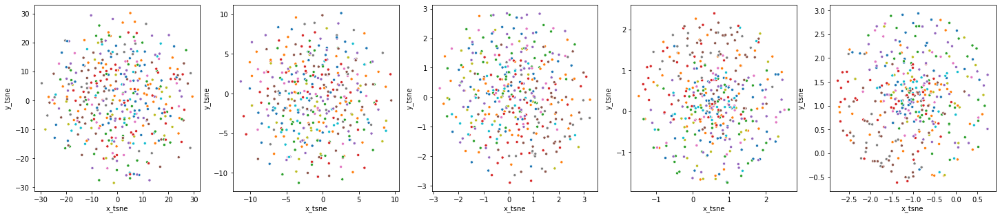

/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.002s...
[t-SNE] Computed neighbors for 400 samples in 0.007s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 115.568520
[t-SNE] KL divergence after 1000 iterations: 2.941043
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.008s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.000000


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] KL divergence after 250 iterations with early exaggeration: 120.612778
[t-SNE] KL divergence after 1000 iterations: 2.862098
[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.010s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.097280


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] KL divergence after 250 iterations with early exaggeration: 125.193008
[t-SNE] KL divergence after 1000 iterations: 2.233365
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.002s...
[t-SNE] Computed neighbors for 400 samples in 0.015s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.115476


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] KL divergence after 250 iterations with early exaggeration: 114.480225
[t-SNE] KL divergence after 1000 iterations: 1.694454
[t-SNE] Computing 181 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.018s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.127448


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] KL divergence after 250 iterations with early exaggeration: 101.892853
[t-SNE] KL divergence after 1000 iterations: 1.375544
Verbose is  1 , learning rate  200.0 .


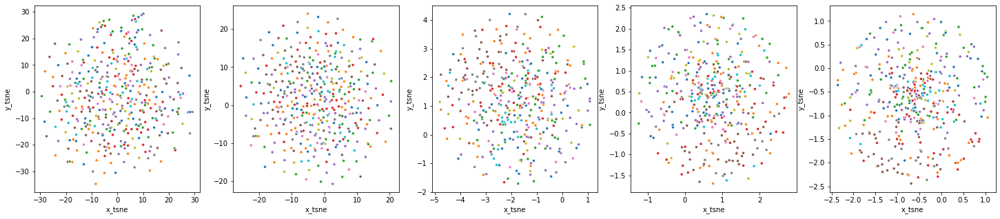

/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.002s...
[t-SNE] Computed neighbors for 400 samples in 0.007s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 116.622147
[t-SNE] KL divergence after 1000 iterations: 2.904028
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.002s...
[t-SNE] Computed neighbors for 400 samples in 0.010s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.000000


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] KL divergence after 250 iterations with early exaggeration: 125.878632
[t-SNE] KL divergence after 1000 iterations: 2.974597
[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.002s...
[t-SNE] Computed neighbors for 400 samples in 0.011s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.097280


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] KL divergence after 250 iterations with early exaggeration: 123.308517
[t-SNE] KL divergence after 1000 iterations: 2.726358
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.014s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.115476


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] KL divergence after 250 iterations with early exaggeration: 115.666870
[t-SNE] KL divergence after 1000 iterations: 1.693791
[t-SNE] Computing 181 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.002s...
[t-SNE] Computed neighbors for 400 samples in 0.019s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.127448


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] KL divergence after 250 iterations with early exaggeration: 110.910881
[t-SNE] KL divergence after 1000 iterations: 1.374885
Verbose is  1 , learning rate  300.0 .


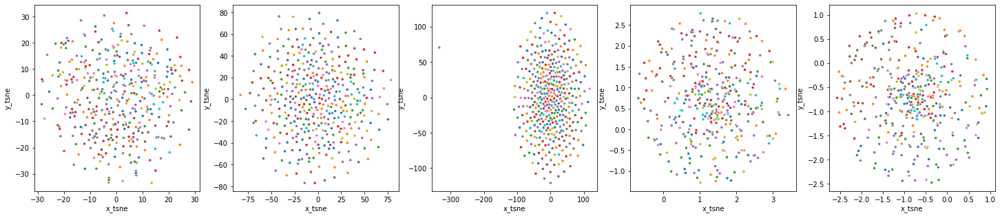

In [121]:
perplexity = [5, 10, 20, 40, 60]
learning_rate = [20., 90., 150., 200.0, 300.]
verbose = [1]
for j in verbose:
  for k in learning_rate:
    fig, axs = plt.subplots(ncols=5, figsize=(25,5))
    for i in [0, 1, 2, 3, 4]:
      tsne = TSNE(n_components=2, perplexity=perplexity[i], verbose=j, random_state=number_state, learning_rate=k, 
                 n_jobs=-1, metric="precomputed")
      z_tsne = tsne.fit_transform(sim_df)
      z_tsne = pd.DataFrame({"x_tsne":z_tsne[:,0], "y_tsne":z_tsne[:,1]})

      sns.scatterplot(ax=axs[i], x=z_tsne.iloc[:,0], y=z_tsne.iloc[:,1], legend=False, size=0.7, 
                      hue=new_tag, palette="tab10")
    print("Verbose is ", str(j), ", learning rate ", str(k), ".")
    plt.show()

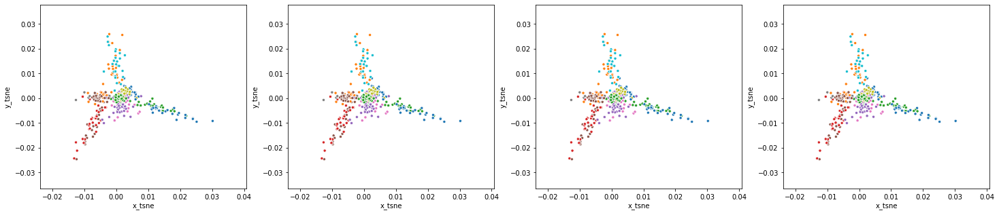

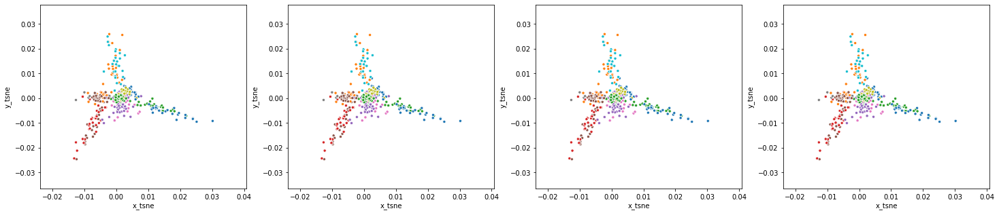

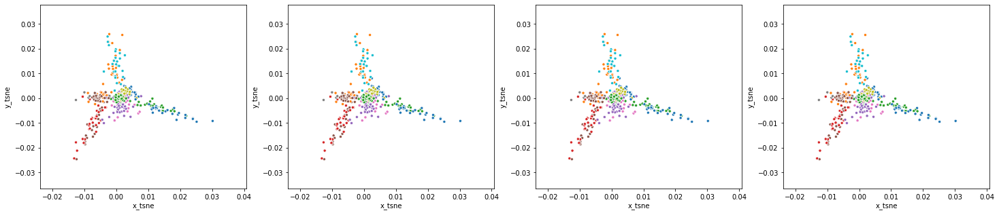

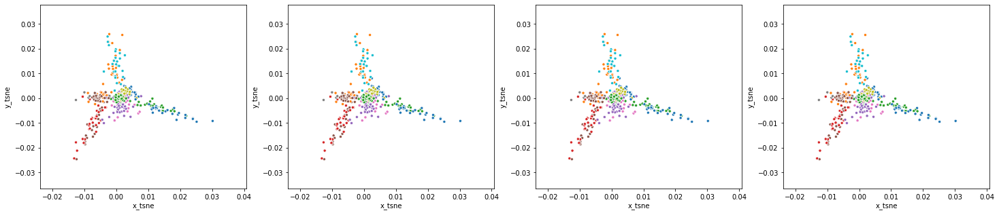

In [119]:
knn = [4, 10, 15, 30] 
gamma = [0.005, 0.5, 0.7, 0.9]
affinity = ["rbf"] 
eigen_solver = ["lobpcg", "arpack"]

for j in [0,1,2,3]:
    fig, axs = plt.subplots(ncols=4, figsize=(25,5))
    for i in [0, 1, 2, 3]:
        embedding = SpectralEmbedding(n_components=2, affinity="precomputed", gamma=gamma[i], eigen_solver=eigen_solver[1], 
                                    n_neighbors=knn[j], random_state=number_state)

        z_tsne = embedding.fit_transform(sim_df)
        z_tsne = pd.DataFrame({"x_tsne":z_tsne[:,0], "y_tsne":z_tsne[:,1]})

        sns.scatterplot(ax=axs[i], x=z_tsne.iloc[:,0], y=z_tsne.iloc[:,1], legend=False, size=0.7, 
                      hue=new_tag, palette="tab10")
    plt.show()

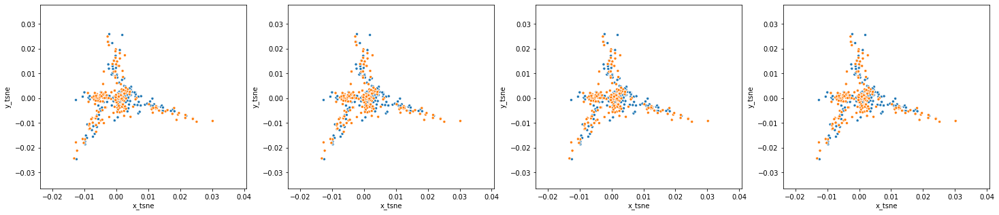

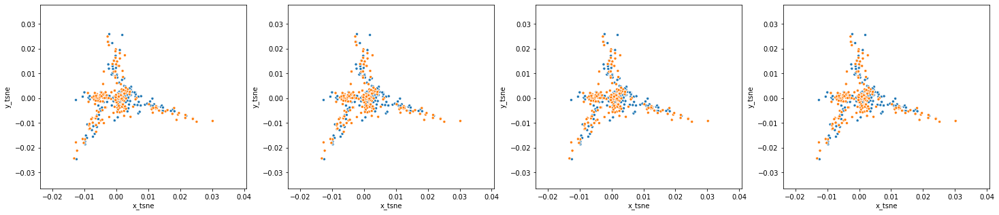

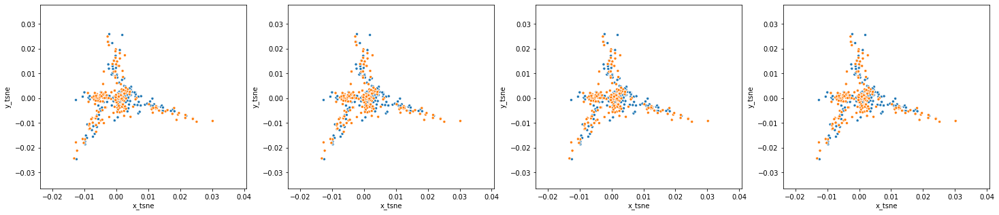

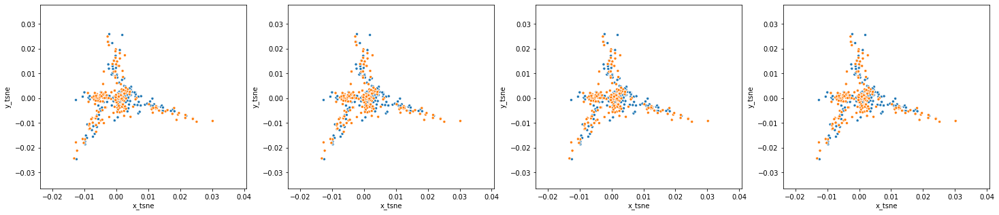

In [120]:
knn = [2, 3, 5, 10] 
gamma = [0.005, 0.5, 0.7, 0.9]
eigen_solver = ["lobpcg", "arpack"]

for j in [0,1,2,3]:
    fig, axs = plt.subplots(ncols=4, figsize=(25,5))
    for i in [0, 1, 2, 3]:
        embedding = SpectralEmbedding(n_components=2, affinity="precomputed", gamma=gamma[i], eigen_solver=eigen_solver[0], 
                                    n_neighbors=knn[j], random_state=number_state)

        z_tsne = embedding.fit_transform(sim_df)
        z_tsne = pd.DataFrame({"x_tsne":z_tsne[:,0], "y_tsne":z_tsne[:,1]})

        sns.scatterplot(ax=axs[i], x=z_tsne.iloc[:,0], y=z_tsne.iloc[:,1], legend=False, size=0.7, 
                      hue=y_tag, palette="tab10")
    plt.show()

### Representación 2d

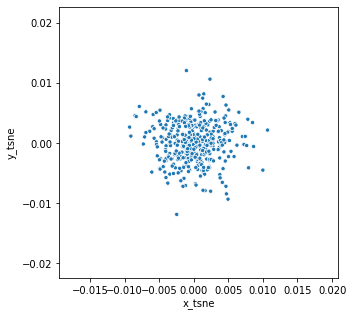

In [74]:
embedding = SpectralEmbedding(n_components=4, affinity="precomputed", gamma=0.6, eigen_solver="lobpcg", 
                                    n_neighbors=10, random_state=number_state)

z_tsne = embedding.fit_transform(sim_df)
z_tsne = pd.DataFrame({"x_tsne":z_tsne[:,0], "y_tsne":z_tsne[:,1]})
fig, axs = plt.subplots(figsize=(5,5))
sns.scatterplot(x=z_tsne.iloc[:,0], y=z_tsne.iloc[:,1], legend=False, size=0.7, palette="tab10")

#### Sentimientos

/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:788: FutureWarning: 'precompute_distances' was deprecated in version 0.23 and will be removed in 1.0 (renaming of 0.25). It has no effect
  ". It has no effect", FutureWarning)


AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

           0       0.49      0.41      0.45       200
           1       0.49      0.57      0.53       200

    accuracy                           0.49       400
   macro avg       0.49      0.49      0.49       400
weighted avg       0.49      0.49      0.49       400



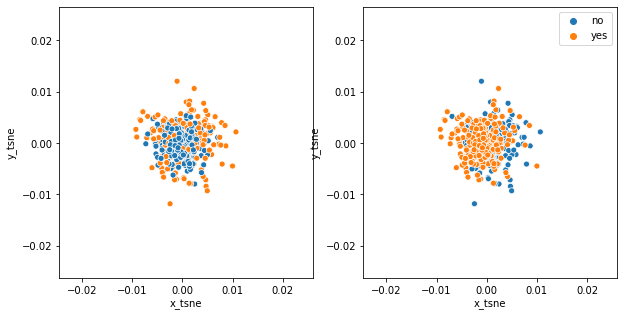

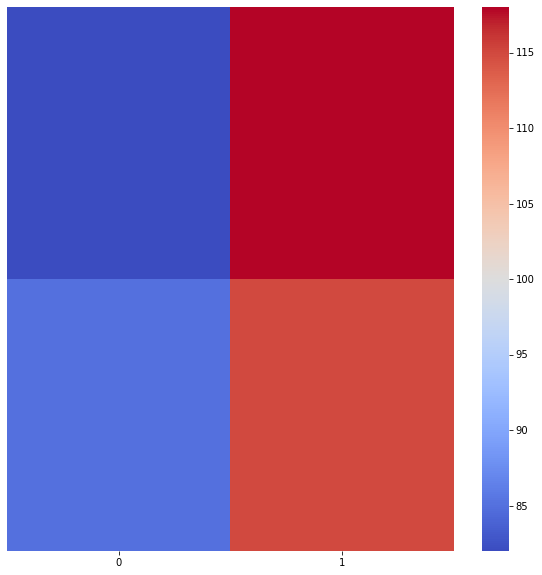

In [75]:
from sklearn_extensions.fuzzy_kmeans import KMedians, FuzzyKMeans
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=2, precompute_distances=True, random_state=19970808)
y = kmeans.fit_predict(sim_df)

fig, axs = plt.subplots(ncols=2, figsize=(10,5))
sns.scatterplot(ax=axs[0], x=z_tsne.iloc[:,0], y=z_tsne.iloc[:,1], hue=y, palette="tab10", legend=False,
               hue_order=[1,0])

sns.scatterplot(ax=axs[1], x=z_tsne.iloc[:,0], y=z_tsne.iloc[:,1], 
                      hue=y_tag, palette="tab10")

change= {"no":1, "yes":0}

new_change = [change[i] for i in y_tag]
metrics_error(new_change, y)

AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

           0       0.63      0.65      0.64       200
           1       0.64      0.62      0.63       200

    accuracy                           0.64       400
   macro avg       0.64      0.64      0.63       400
weighted avg       0.64      0.64      0.63       400



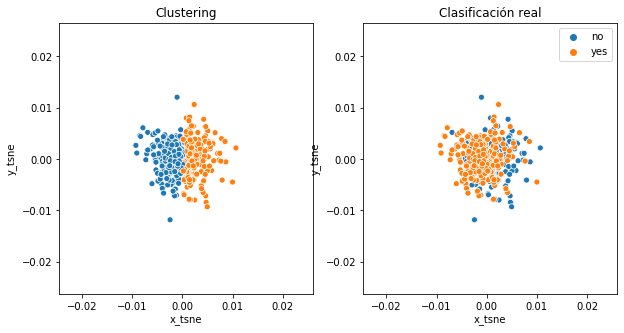

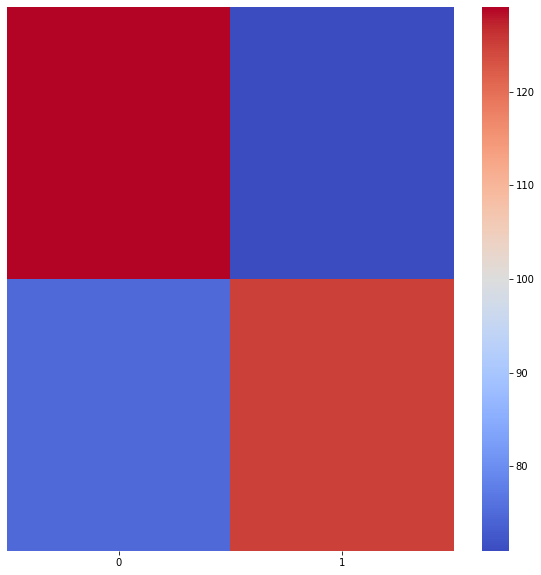

In [76]:
y_new = SpectralClustering(n_clusters=2, random_state=6, affinity="precomputed").fit_predict(sim_df)

fig, axs = plt.subplots(ncols=2, figsize=(10,5))
sns.scatterplot(ax=axs[0], x=z_tsne.iloc[:,0], y=z_tsne.iloc[:,1], hue=y_new, palette="tab10", legend=False)
axs[0].set_title("Clustering")
sns.scatterplot(ax=axs[1], x=z_tsne.iloc[:,0], y=z_tsne.iloc[:,1], hue=y_tag, palette="tab10",
                hue_order=["no", "yes"])
axs[1].set_title("Clasificación real")

change= {"no":1, "yes":0}
new_change = [change[i] for i in y_tag]
metrics_error(new_change, y_new)

#### Productos

AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

           0       0.11      0.10      0.11        50
           1       0.14      0.16      0.15        50
           2       0.10      0.06      0.07        50
           3       0.16      0.26      0.20        50
           4       0.31      0.08      0.13        50
           5       0.10      0.10      0.10        50
           6       0.20      0.16      0.18        50
           7       0.22      0.36      0.27        50

    accuracy                           0.16       400
   macro avg       0.17      0.16      0.15       400
weighted avg       0.17      0.16      0.15       400



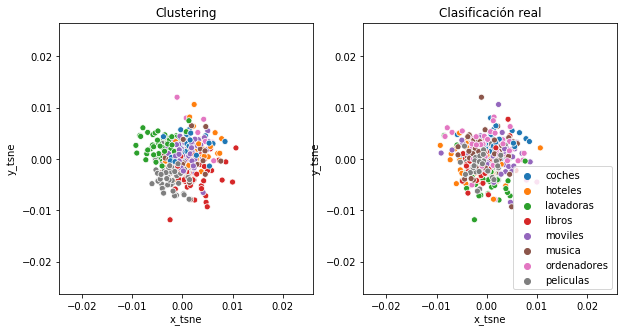

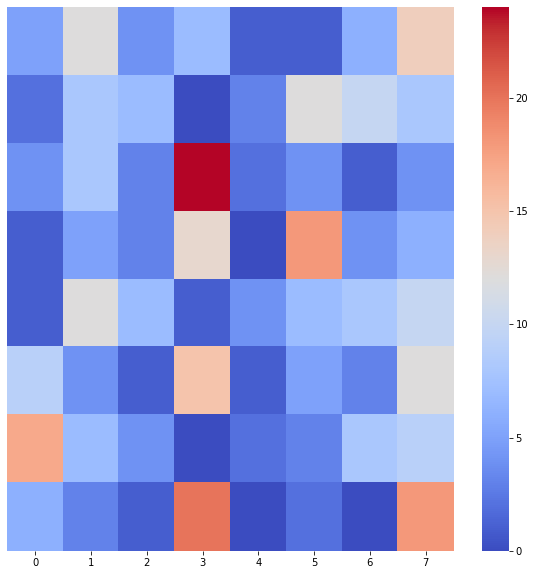

In [77]:
y_new = SpectralClustering(n_clusters=8, random_state=number_state, affinity="precomputed").fit_predict(sim_df)

fig, axs = plt.subplots(ncols=2, figsize=(10,5))

change_inv = {6:"coches", 2:"hoteles", 3:"lavadoras", 5:"libros", 1:"moviles", 0:"musica", 4:"ordenadores",
         7:"peliculas"}

y_new_inv = [change_inv[i] for i in y_new]

sns.scatterplot(ax=axs[0], x=z_tsne.iloc[:,0], y=z_tsne.iloc[:,1], hue=y_new_inv, palette="tab10", legend=False)

sns.scatterplot(ax=axs[1], x=z_tsne.iloc[:,0], y=z_tsne.iloc[:,1], hue=producto_prep, palette="tab10")
axs[0].set_title("Clustering")

axs[1].set_title("Clasificación real")



change= {"coches":6, "hoteles":2, "lavadoras":3, "libros":5, "moviles":1, "musica":0, "ordenadores":4,
         "peliculas":7}


new_change = [change[i] for i in producto_prep]
metrics_error(new_change, y_new)

In [70]:
from sklearn_extensions.fuzzy_kmeans import KMedians, FuzzyKMeans
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=8, precompute_distances=True, random_state=19970808)
y = kmeans.fit_predict(sim_df)


/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:788: FutureWarning: 'precompute_distances' was deprecated in version 0.23 and will be removed in 1.0 (renaming of 0.25). It has no effect
  ". It has no effect", FutureWarning)


AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

           0       0.57      0.58      0.57        50
           1       0.58      0.64      0.61        50
           2       0.60      0.72      0.65        50
           3       0.41      0.58      0.48        50
           4       0.97      0.78      0.87        50
           5       1.00      0.76      0.86        50
           6       1.00      0.82      0.90        50
           7       1.00      0.88      0.94        50

    accuracy                           0.72       400
   macro avg       0.77      0.72      0.74       400
weighted avg       0.77      0.72      0.74       400



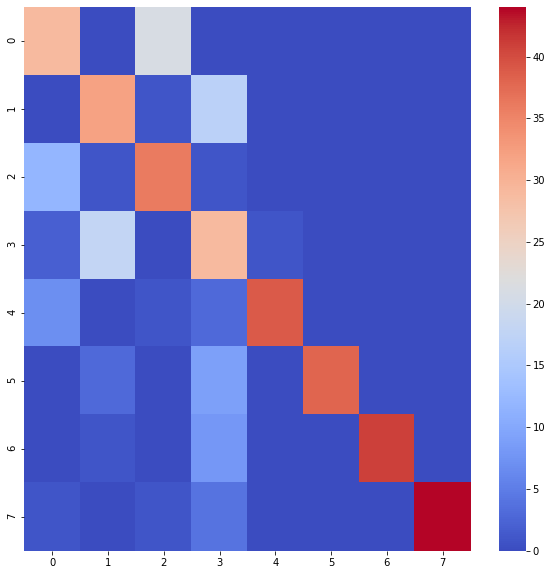

In [71]:
change= {"coches":6, "hoteles":7, "lavadoras":5, "libros":0, "moviles":1, "musica":4, "ordenadores":3,
         "peliculas":2}


change_inv = {6:"coches", 7:"hoteles", 5:"lavadoras", 0:"libros", 1:"moviles", 4:"musica", 3:"ordenadores",
         2:"peliculas"}

y_change = [change_inv[i] for i in y]

new_change = [change[i] for i in producto_prep]
metrics_error(new_change, y)

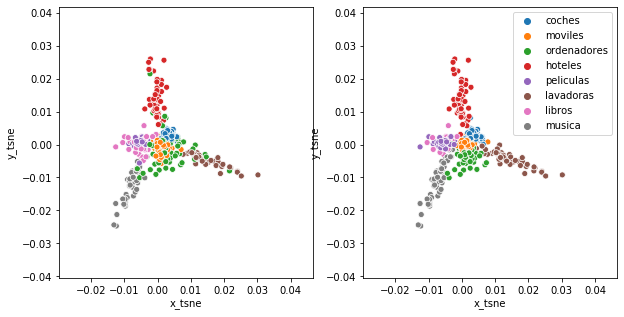

In [72]:
fig, axs = plt.subplots(ncols=2, figsize=(10,5))
sns.scatterplot(ax=axs[0], x=z_tsne.iloc[:,0], y=z_tsne.iloc[:,1], hue=y_change, palette="tab10", 
                legend=False)

sns.scatterplot(ax=axs[1], x=z_tsne.iloc[:,0], y=z_tsne.iloc[:,1], hue=producto_prep, palette="tab10",
                hue_order=["coches","moviles", "ordenadores","hoteles", "peliculas", "lavadoras", "libros",
                                "musica"])


#### Productos y sentimientos

In [55]:
from sklearn_extensions.fuzzy_kmeans import KMedians, FuzzyKMeans
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=16, precompute_distances=True, random_state=19970808)
y = kmeans.fit_predict(sim_df)

/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:788: FutureWarning: 'precompute_distances' was deprecated in version 0.23 and will be removed in 1.0 (renaming of 0.25). It has no effect
  ". It has no effect", FutureWarning)


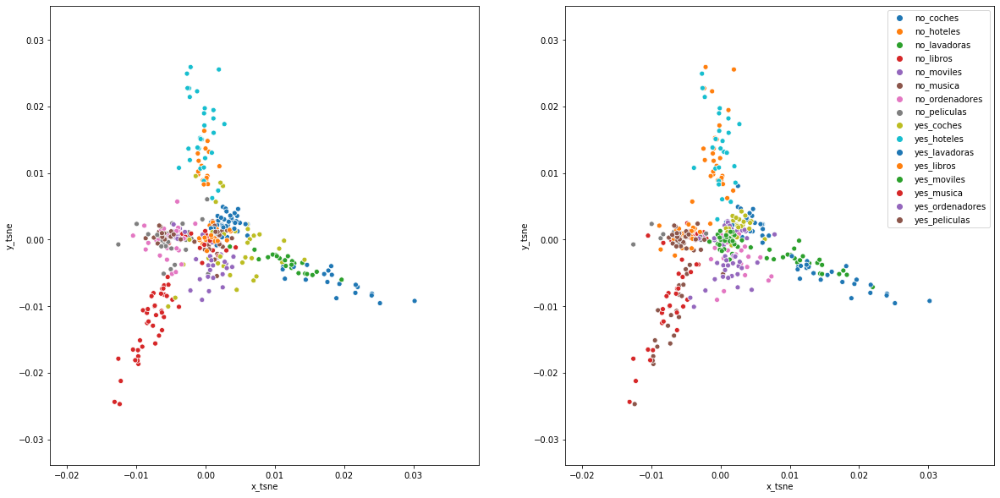

In [56]:
fig, axs = plt.subplots(ncols=2, figsize=(20,10))
sns.scatterplot(ax=axs[0], x=z_tsne.iloc[:,0], y=z_tsne.iloc[:,1], hue=y, palette="tab10", legend=False,
               hue_order=[0, 14, 8, 4, 2, 5, 10, 15, 11, 9, 12, 10, 13, 6, 7, 3, 1])

sns.scatterplot(ax=axs[1], x=z_tsne.iloc[:,0], y=z_tsne.iloc[:,1], 
                      hue=new_tag, palette="tab10")

Text(0.5, 1.0, 'Clasificación real')

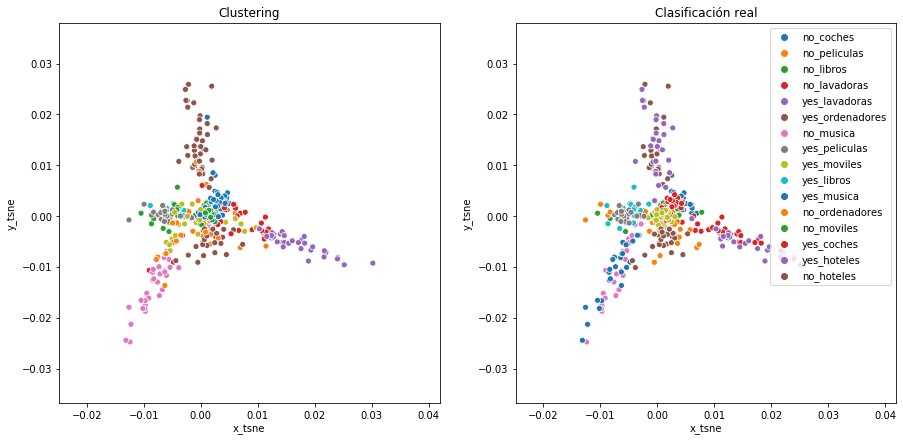

In [57]:
y_new = SpectralClustering(n_clusters=16, random_state=number_state, affinity="precomputed").fit_predict(sim_df)


change_inv = {2:'no_coches',
 6:'no_hoteles',
 9:'no_lavadoras',
 5:'no_libros',
 7:'no_moviles',
 8:'no_musica',
 15:'no_ordenadores',
 12:'no_peliculas',
 0:'yes_coches',
 11:'yes_hoteles',
 10:'yes_lavadoras',
 3:'yes_libros',
 4:'yes_moviles',
 14:'yes_musica',
 13:'yes_ordenadores',
 1:'yes_peliculas'}

y_new_inv = [change_inv[i] for i in y_new]

fig, axs = plt.subplots(ncols=2, figsize=(15,7))
sns.scatterplot(ax=axs[0], x=z_tsne.iloc[:,0], y=z_tsne.iloc[:,1], hue=y_new_inv, palette="tab10",
               hue_order=list(set(change)), legend=False)

sns.scatterplot(ax=axs[1], x=z_tsne.iloc[:,0], y=z_tsne.iloc[:,1], hue=new_tag, palette="tab10",
               hue_order=list(set(change)))
axs[0].set_title("Clustering")

axs[1].set_title("Clasificación real")


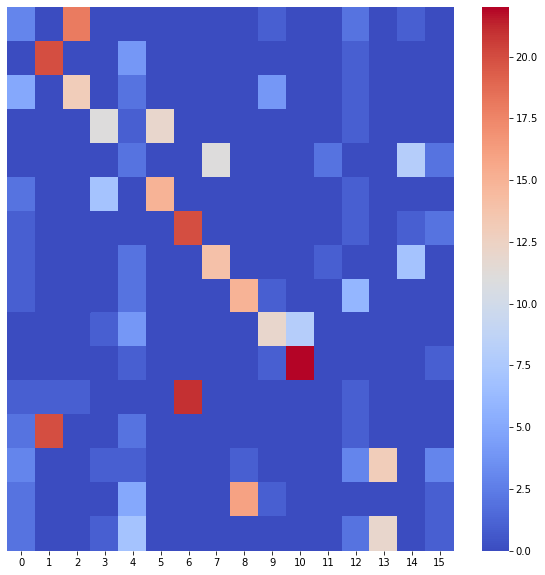

In [65]:
change= {'no_coches':2,
 'no_hoteles':11,
 'no_lavadoras':9,
 'no_libros':5,
 'no_moviles':7,
 'no_musica':14,
 'no_ordenadores':15,
 'no_peliculas':12,
 'yes_coches':0,
 'yes_hoteles':6,
 'yes_lavadoras':10,
 'yes_libros':3,
 'yes_moviles':4,
 'yes_musica':8,
 'yes_ordenadores':13,
 'yes_peliculas':1}


change_inv = {2:'no_coches',
 6:'no_hoteles',
 9:'no_lavadoras',
 5:'no_libros',
 7:'no_moviles',
 8:'no_musica',
 15:'no_ordenadores',
 12:'no_peliculas',
 0:'yes_coches',
 11:'yes_hoteles',
 10:'yes_lavadoras',
 3:'yes_libros',
 4:'yes_moviles',
 14:'yes_musica',
 13:'yes_ordenadores',
 1:'yes_peliculas'}

new_change = [change[i] for i in new_tag]
confusion_matrix = metrics.confusion_matrix(new_change, y_new)
fig, axs = plt.subplots(figsize=(10,10))
sns.heatmap(confusion_matrix, annot=False, cmap="coolwarm", xticklabels = True, yticklabels = False)


In [63]:
labels

<a list of 0 Text yticklabel objects>

In [61]:
confusion_matrix

array([[ 3,  0, 18,  0,  0,  0,  0,  0,  0,  1,  0,  0,  2,  0,  1,  0],
       [ 0, 20,  0,  0,  4,  0,  0,  0,  0,  0,  0,  0,  1,  0,  0,  0],
       [ 5,  0, 13,  0,  2,  0,  0,  0,  0,  4,  0,  0,  1,  0,  0,  0],
       [ 0,  0,  0, 11,  1, 12,  0,  0,  0,  0,  0,  0,  1,  0,  0,  0],
       [ 0,  0,  0,  0,  2,  0,  0, 11,  0,  0,  0,  2,  0,  0,  8,  2],
       [ 2,  0,  0,  7,  0, 15,  0,  0,  0,  0,  0,  0,  1,  0,  0,  0],
       [ 1,  0,  0,  0,  0,  0, 20,  0,  0,  0,  0,  0,  1,  0,  1,  2],
       [ 1,  0,  0,  0,  2,  0,  0, 14,  0,  0,  0,  1,  0,  0,  7,  0],
       [ 1,  0,  0,  0,  2,  0,  0,  0, 15,  1,  0,  0,  6,  0,  0,  0],
       [ 0,  0,  0,  1,  4,  0,  0,  0,  0, 12,  8,  0,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  1,  0,  0,  0,  0,  1, 22,  0,  0,  0,  0,  1],
       [ 1,  1,  1,  0,  0,  0, 21,  0,  0,  0,  0,  0,  1,  0,  0,  0],
       [ 2, 20,  0,  0,  2,  0,  0,  0,  0,  0,  0,  0,  1,  0,  0,  0],
       [ 3,  0,  0,  1,  1,  0,  0,  0,  1,  0,  0,

## Modelo de predicción

In [147]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegressionCV
number_state = 19970808

In [157]:
vectorizer = CountVectorizer(lowercase=True, ngram_range= (1,1), binary=False, max_features=3000)
corpus_sort_reviews_no = [corpus_prep3[i] for i in reviews_no_index]
corpus_sort_reviews_yes = [corpus_prep3[i] for i in reviews_yes_index]
corpus_prep33 = corpus_sort_reviews_no+corpus_sort_reviews_yes

producto_prep_no = [productos[i] for i in reviews_no_index]
producto_prep_yes = [productos[i] for i in reviews_yes_index]
producto_prep = producto_prep_no+producto_prep_yes


X = vectorizer.fit_transform(corpus_prep33)
bow = X.toarray()
bow_df = pd.DataFrame(bow,columns=vectorizer.get_feature_names())

y_tag = np.repeat("no", 200)
y_tag = np.concatenate([y_tag,np.repeat("yes", 200)])

X_train, X_test, y_train, y_test = train_test_split(bow_df, y_tag, test_size=0.30, random_state=number_state)

In [168]:
    pca = PCA(n_components=280, random_state=19970808, svd_solver="full") #
    X_pca_train = pca.fit_transform(X_train)
    X_pca_test = pca.transform(X_test)

In [178]:
log_reg = LogisticRegressionCV(solver='sag', max_iter=1000, random_state=semilla, multi_class="ovr", n_jobs=-1, 
                               penalty="l2", Cs=[0.1, 0.05, 0.0094,0.005], cv=9)

In [179]:
    log_reg.fit(X_pca_train, y_train)


LogisticRegressionCV(Cs=[0.1, 0.05, 0.0094, 0.005], cv=9, max_iter=1000,
                     multi_class='ovr', n_jobs=-1, random_state=19970808,
                     solver='sag')

AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

          no       0.99      0.98      0.99       149
         yes       0.98      0.99      0.98       131

    accuracy                           0.99       280
   macro avg       0.99      0.99      0.99       280
weighted avg       0.99      0.99      0.99       280



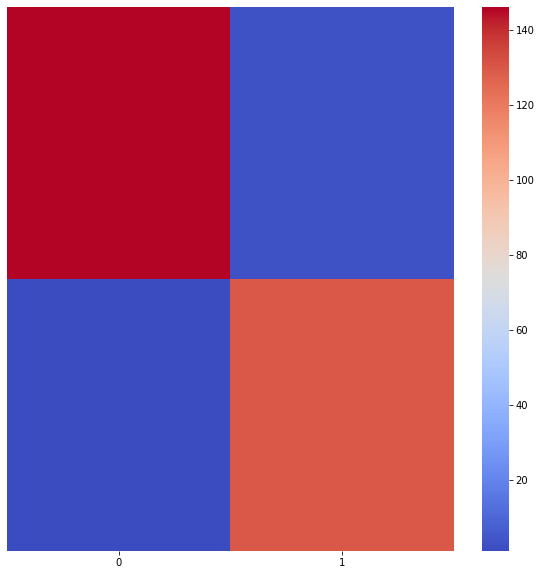

In [180]:
metrics_error(log_reg.predict(X_pca_train), y_train)

AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

          no       0.74      0.65      0.69        60
         yes       0.69      0.77      0.72        60

    accuracy                           0.71       120
   macro avg       0.71      0.71      0.71       120
weighted avg       0.71      0.71      0.71       120



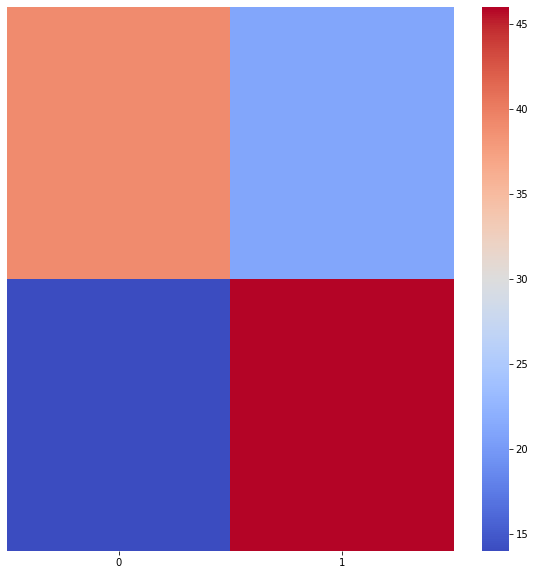

In [181]:
metrics_error(log_reg.predict(X_pca_test), y_test)

In [191]:
def log_regression_clasification(X_train, y_train, X_test, y_test):
    log_reg = LogisticRegressionCV(solver='sag', max_iter=1000, random_state=semilla,
multi_class="multinomial", n_jobs=-1, Cs=[0.1, 0.05, 0.0094,0.005], cv=9)
    log_reg.fit(X_train, y_train)
    
    print("----------Errors train------------------")
    y_predict_m = log_reg.predict(X_train)
    metrics_error(y_train, y_predict_m)    
    
    print("----------Errors test------------------")
    y_predict_m = log_reg.predict(X_test)
    metrics_error(y_test, y_predict_m)
    
    
    log_reg = LogisticRegressionCV(solver='sag', max_iter=1000, random_state=semilla,
multi_class="ovr", n_jobs=-1, penalty="l2", Cs=[0.1, 0.05, 0.0094,0.005], cv=5)
    log_reg.fit(X_train, y_train)
    
    print("----------Errors train------------------")
    y_predict_ovr = log_reg.predict(X_train)
    metrics_error(y_train, y_predict_ovr)

    print("----------Errors test------------------")
    y_predict_ovr = log_reg.predict(X_test)
    metrics_error(y_test, y_predict_ovr)
    return y_predict_m, y_predict_ovr

Clasiffication using LDA
----------Errors train------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

          no       0.76      0.89      0.82       147
         yes       0.85      0.69      0.76       133

    accuracy                           0.80       280
   macro avg       0.81      0.79      0.79       280
weighted avg       0.80      0.80      0.79       280

----------Errors test------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

          no       0.63      0.74      0.68        53
         yes       0.76      0.66      0.70        67

    accuracy                           0.69       120
   macro avg       0.69      0.70      0.69       120
weighted avg       0.70      0.69      0.69       120

Clasiffication using QDA
----------Errors train------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

          n

/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:808: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

          no       0.99      1.00      1.00       147
         yes       1.00      0.99      1.00       133

    accuracy                           1.00       280
   macro avg       1.00      1.00      1.00       280
weighted avg       1.00      1.00      1.00       280

----------Errors test------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

          no       0.41      0.34      0.37        53
         yes       0.54      0.61      0.57        67

    accuracy                           0.49       120
   macro avg       0.47      0.48      0.47       120
weighted avg       0.48      0.49      0.48       120

Clasiffication using LDA
----------Errors train------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

          no       0.99      1.00      1.00       147
         yes       1.00

/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:808: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

          no       0.99      1.00      1.00       147
         yes       1.00      0.99      1.00       133

    accuracy                           1.00       280
   macro avg       1.00      1.00      1.00       280
weighted avg       1.00      1.00      1.00       280

----------Errors test------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

          no       0.42      0.34      0.37        53
         yes       0.55      0.63      0.58        67

    accuracy                           0.50       120
   macro avg       0.48      0.48      0.48       120
weighted avg       0.49      0.50      0.49       120



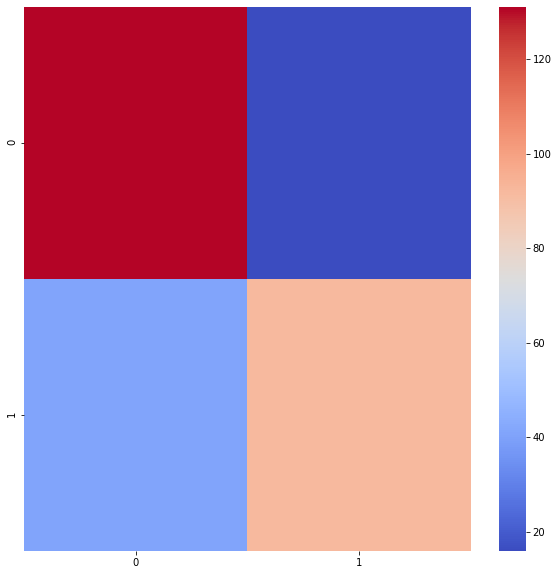

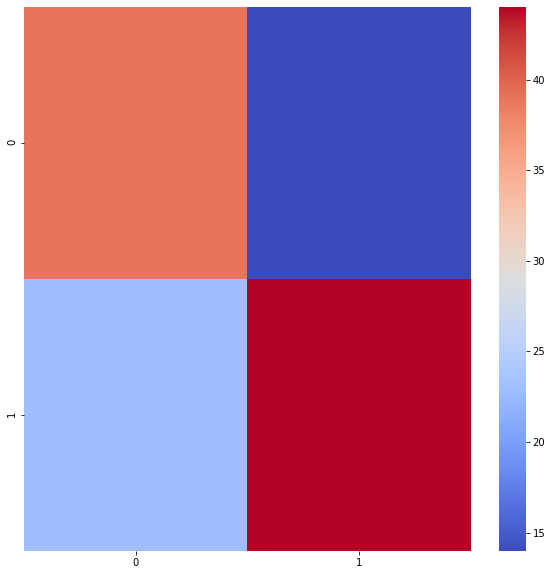

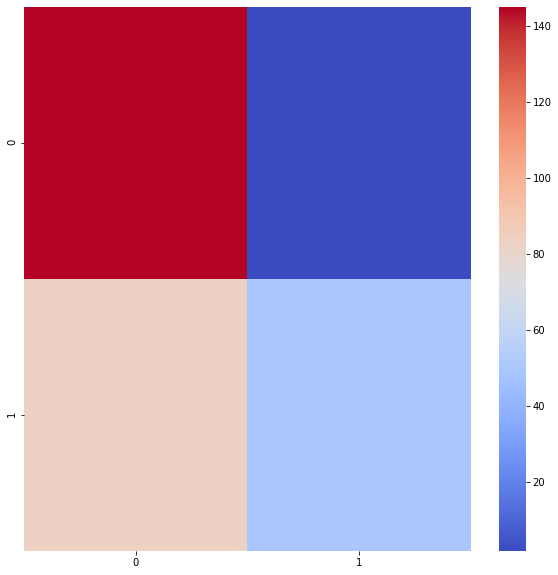

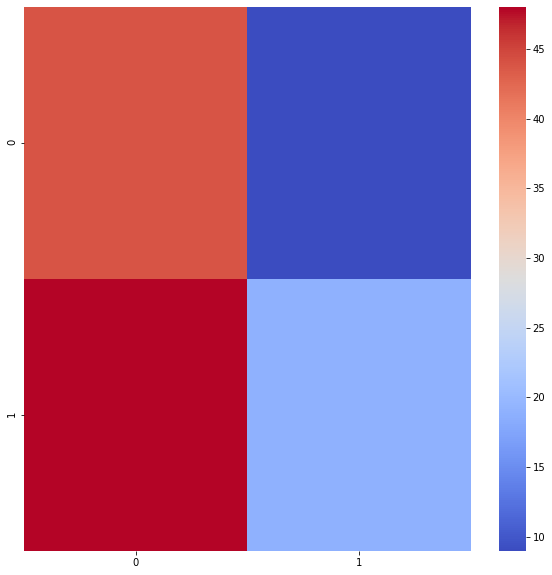

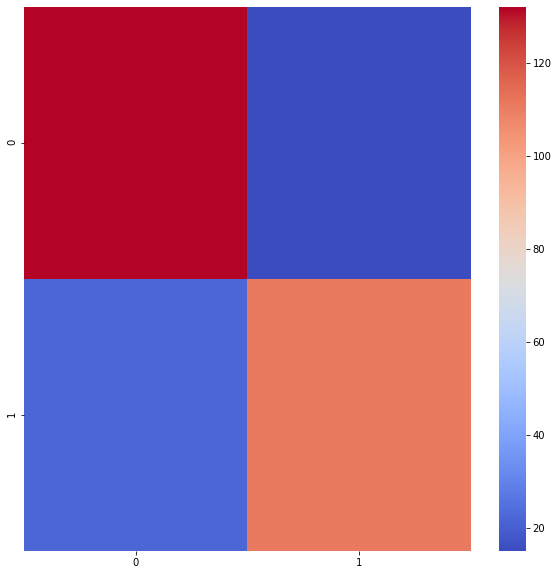

...

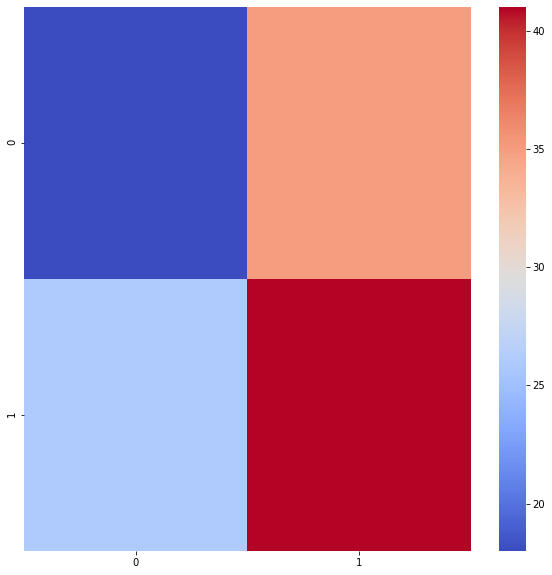

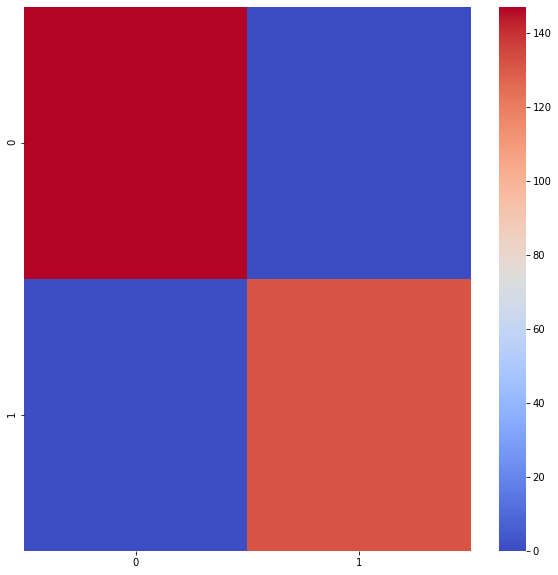

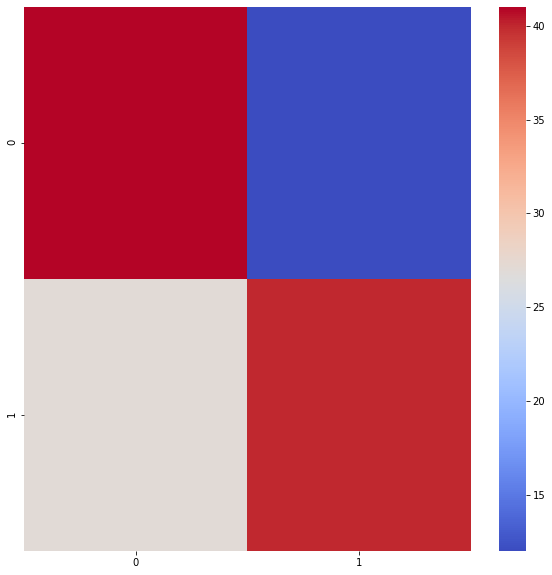

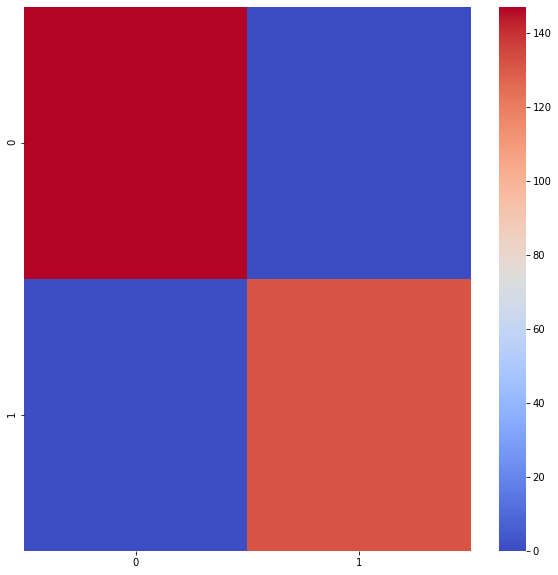

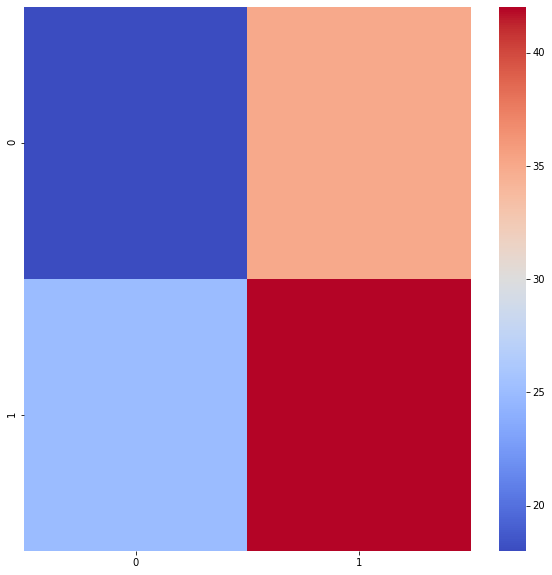

In [196]:
for i in [50, 100, 200, 270]:
    pca = PCA(n_components=i, random_state=19970808, svd_solver="full") #
    X_pca_train = pca.fit_transform(X_train)
    X_pca_test = pca.transform(X_test)
      
    print("Clasiffication using LDA")
    predict_lda = LDA_clasification(X_pca_train, y_train, X_pca_test, y_test)
    
    print("Clasiffication using QDA")
    predict_qda = QDA_clasification(X_pca_train, y_train, X_pca_test, y_test)

Clasiffication using LogRegresion
----------Errors train------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

          no       0.99      1.00      1.00       147
         yes       1.00      0.99      1.00       133

    accuracy                           1.00       280
   macro avg       1.00      1.00      1.00       280
weighted avg       1.00      1.00      1.00       280

----------Errors test------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

          no       0.62      0.70      0.65        53
         yes       0.73      0.66      0.69        67

    accuracy                           0.68       120
   macro avg       0.68      0.68      0.67       120
weighted avg       0.68      0.68      0.68       120

----------Errors train------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

          no       0.98    

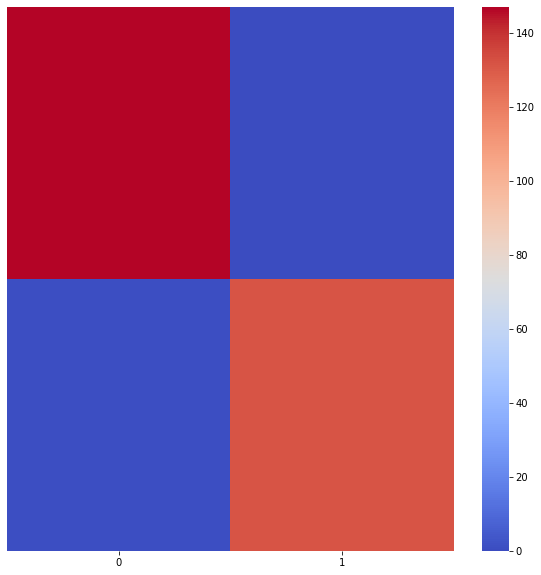

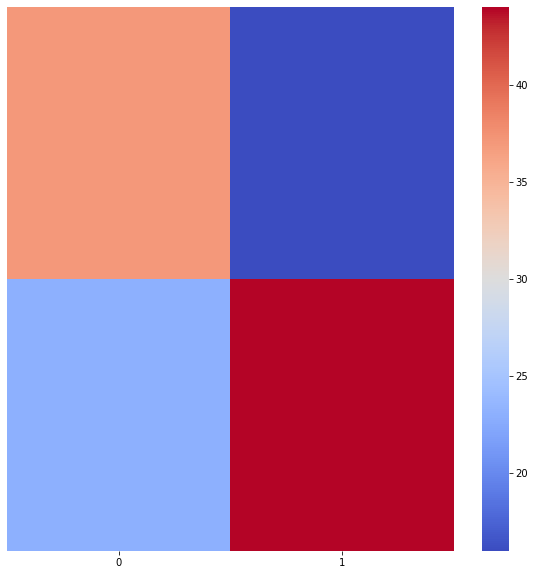

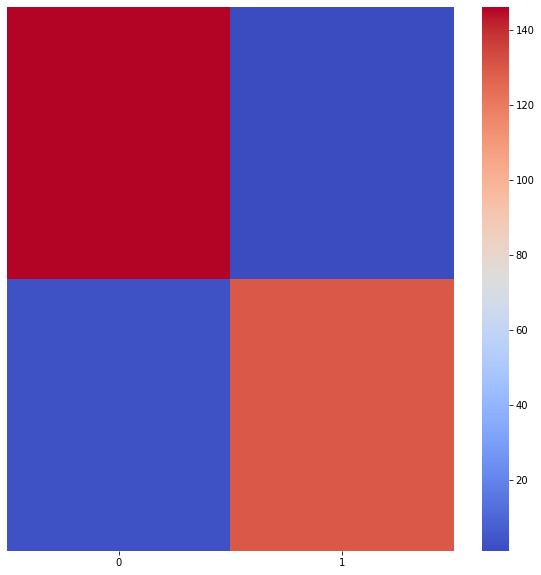

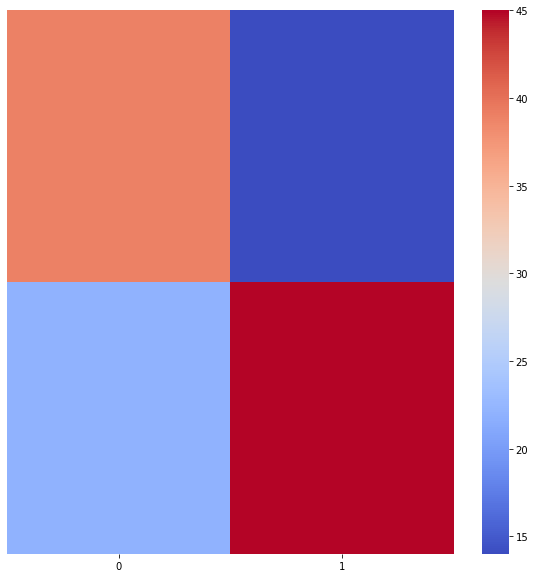

In [192]:
    pca = PCA(n_components=280, random_state=19970808, svd_solver="full") #
    X_pca_train = pca.fit_transform(X_train)
    X_pca_test = pca.transform(X_test)
      
    
    print("Clasiffication using LogRegresion")
    predict_log_m, predict_log_ovr = log_regression_clasification(X_train, y_train, X_test, y_test)

Clasiffication using LogRegresion
----------Errors train------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

          no       0.99      1.00      1.00       147
         yes       1.00      0.99      1.00       133

    accuracy                           1.00       280
   macro avg       1.00      1.00      1.00       280
weighted avg       1.00      1.00      1.00       280

----------Errors test------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

          no       0.62      0.72      0.67        53
         yes       0.75      0.66      0.70        67

    accuracy                           0.68       120
   macro avg       0.68      0.69      0.68       120
weighted avg       0.69      0.68      0.68       120

----------Errors train------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

          no       0.99    

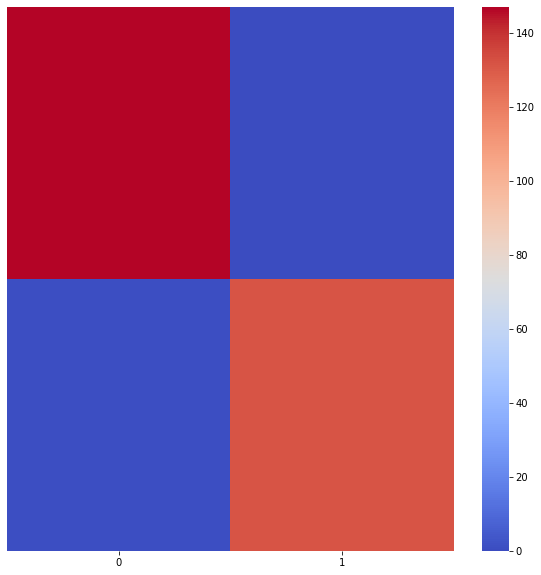

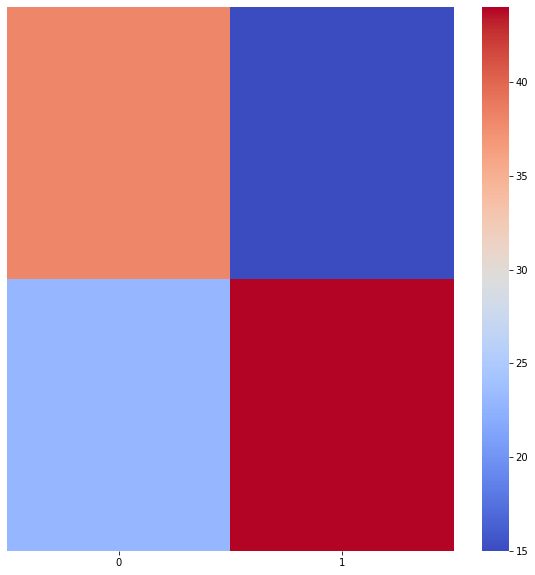

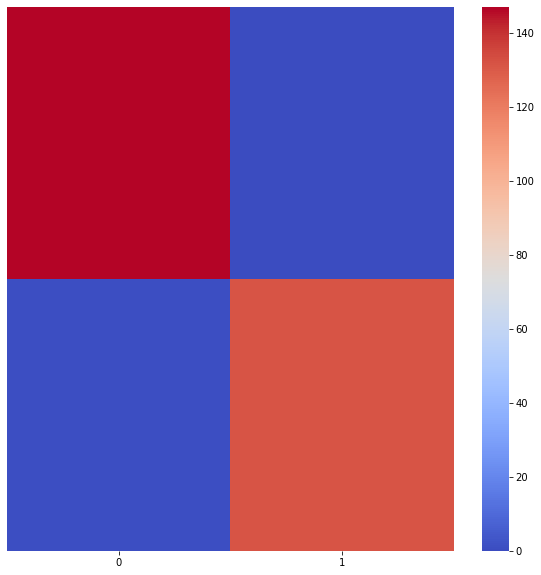

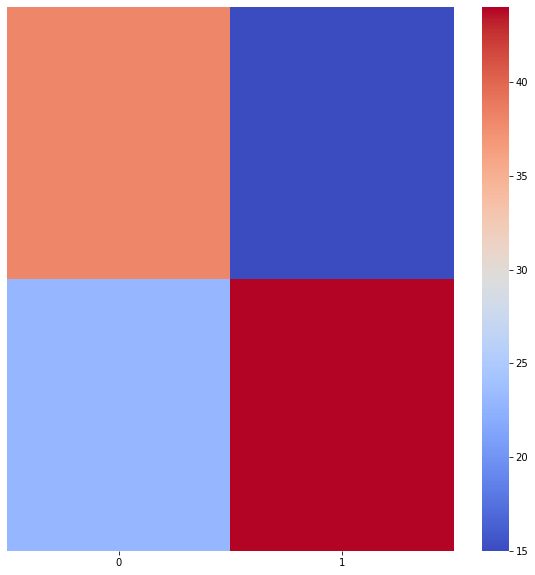

In [195]:
        pca = PCA(n_components=280, random_state=19970808, svd_solver="full") #
        X_pca_train = pca.fit_transform(X_train)
        X_pca_test = pca.transform(X_test)

        print("Clasiffication using LogRegresion")
        predict_log_m, predict_log_ovr = log_regression_clasification(X_pca_train, y_train, X_pca_test, y_test)

### Productos

In [197]:
vectorizer = CountVectorizer(lowercase=True, ngram_range= (1,1), binary=False, max_features=3000)
corpus_sort_reviews_no = [corpus_prep3[i] for i in reviews_no_index]
corpus_sort_reviews_yes = [corpus_prep3[i] for i in reviews_yes_index]
corpus_prep33 = corpus_sort_reviews_no+corpus_sort_reviews_yes

producto_prep_no = [productos[i] for i in reviews_no_index]
producto_prep_yes = [productos[i] for i in reviews_yes_index]
producto_prep = producto_prep_no+producto_prep_yes


X = vectorizer.fit_transform(corpus_prep33)
bow = X.toarray()
bow_df = pd.DataFrame(bow,columns=vectorizer.get_feature_names())

y_tag = np.repeat("no", 200)
y_tag = np.concatenate([y_tag,np.repeat("yes", 200)])

X_train, X_test, y_train, y_test = train_test_split(bow_df, producto_prep, test_size=0.30, random_state=number_state)

Clasiffication using LDA
----------Errors train------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

      coches       0.66      1.00      0.80        37
     hoteles       1.00      0.92      0.96        38
   lavadoras       1.00      0.89      0.94        35
      libros       0.97      0.90      0.93        39
     moviles       1.00      0.88      0.94        33
      musica       0.93      0.93      0.93        28
 ordenadores       0.88      0.97      0.92        31
   peliculas       1.00      0.79      0.89        39

    accuracy                           0.91       280
   macro avg       0.93      0.91      0.91       280
weighted avg       0.93      0.91      0.91       280

----------Errors test------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

      coches       0.59      1.00      0.74        13
     hoteles       0.91      0.83      0.87        12
   lavad

/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:808: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

      coches       1.00      1.00      1.00        37
     hoteles       1.00      1.00      1.00        38
   lavadoras       1.00      1.00      1.00        35
      libros       1.00      1.00      1.00        39
     moviles       1.00      1.00      1.00        33
      musica       1.00      1.00      1.00        28
 ordenadores       1.00      1.00      1.00        31
   peliculas       1.00      1.00      1.00        39

    accuracy                           1.00       280
   macro avg       1.00      1.00      1.00       280
weighted avg       1.00      1.00      1.00       280

----------Errors test------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

      coches       1.00      0.54      0.70        13
     hoteles       0.29      0.17      0.21        12
   lavadoras       0.42      0.53      0.47        15
      libros       0

/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:808: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

      coches       1.00      1.00      1.00        37
     hoteles       1.00      1.00      1.00        38
   lavadoras       1.00      1.00      1.00        35
      libros       1.00      1.00      1.00        39
     moviles       1.00      1.00      1.00        33
      musica       1.00      1.00      1.00        28
 ordenadores       1.00      1.00      1.00        31
   peliculas       1.00      1.00      1.00        39

    accuracy                           1.00       280
   macro avg       1.00      1.00      1.00       280
weighted avg       1.00      1.00      1.00       280

----------Errors test------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

      coches       0.56      0.38      0.45        13
     hoteles       0.27      0.33      0.30        12
   lavadoras       0.50      0.27      0.35        15
      libros       0

/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:808: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

      coches       1.00      1.00      1.00        37
     hoteles       1.00      1.00      1.00        38
   lavadoras       1.00      1.00      1.00        35
      libros       1.00      1.00      1.00        39
     moviles       1.00      1.00      1.00        33
      musica       1.00      1.00      1.00        28
 ordenadores       1.00      1.00      1.00        31
   peliculas       1.00      1.00      1.00        39

    accuracy                           1.00       280
   macro avg       1.00      1.00      1.00       280
weighted avg       1.00      1.00      1.00       280

----------Errors test------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

      coches       0.00      0.00      0.00        13
     hoteles       0.25      0.08      0.12        12
   lavadoras       0.64      0.47      0.54        15
      libros       0

/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:808: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

      coches       1.00      1.00      1.00        37
     hoteles       1.00      1.00      1.00        38
   lavadoras       1.00      1.00      1.00        35
      libros       1.00      1.00      1.00        39
     moviles       1.00      1.00      1.00        33
      musica       1.00      1.00      1.00        28
 ordenadores       1.00      1.00      1.00        31
   peliculas       1.00      1.00      1.00        39

    accuracy                           1.00       280
   macro avg       1.00      1.00      1.00       280
weighted avg       1.00      1.00      1.00       280

----------Errors test------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

      coches       0.33      0.08      0.12        13
     hoteles       0.20      0.17      0.18        12
   lavadoras       0.80      0.27      0.40        15
      libros       0

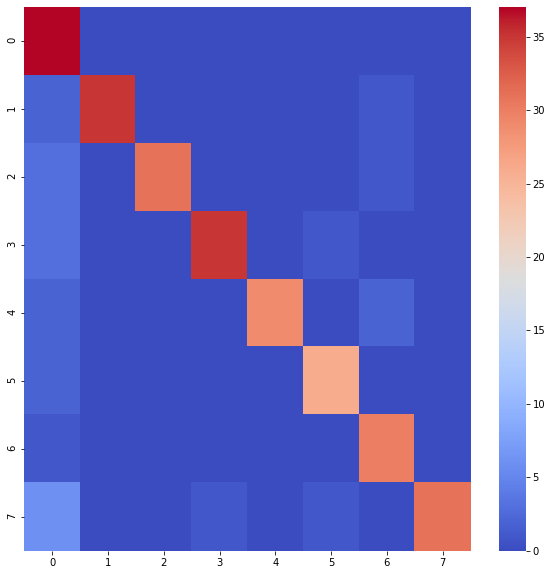

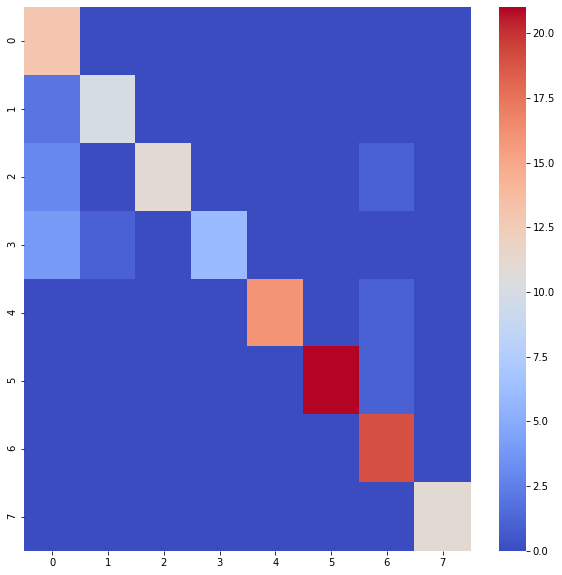

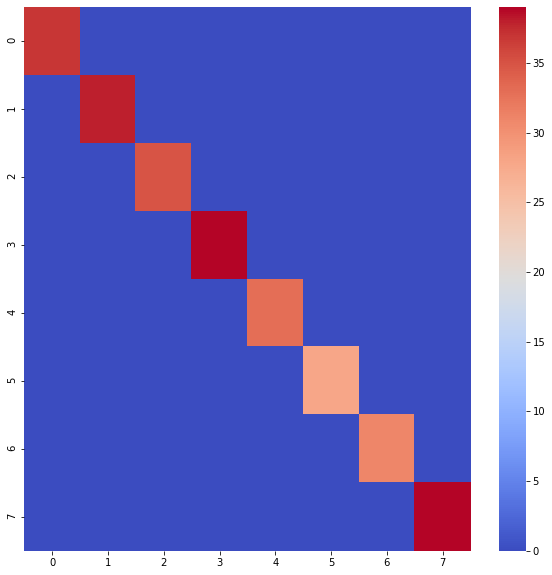

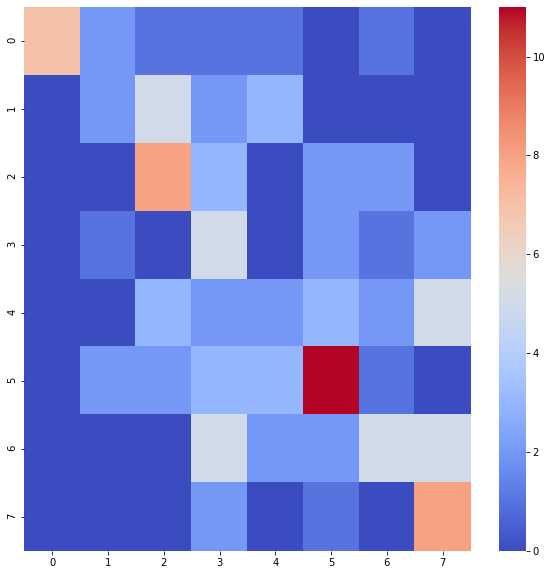

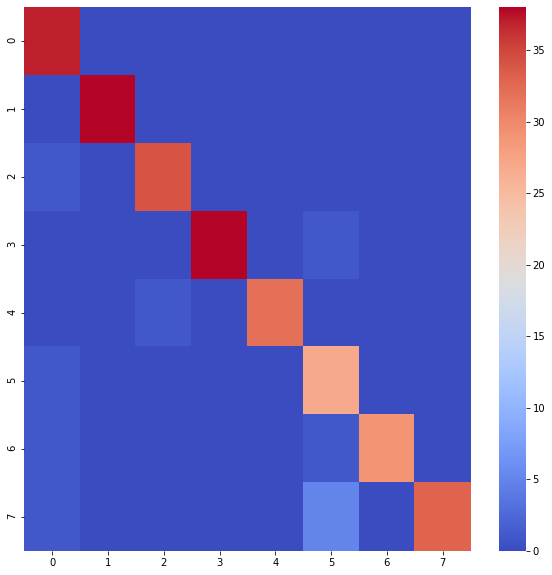

...

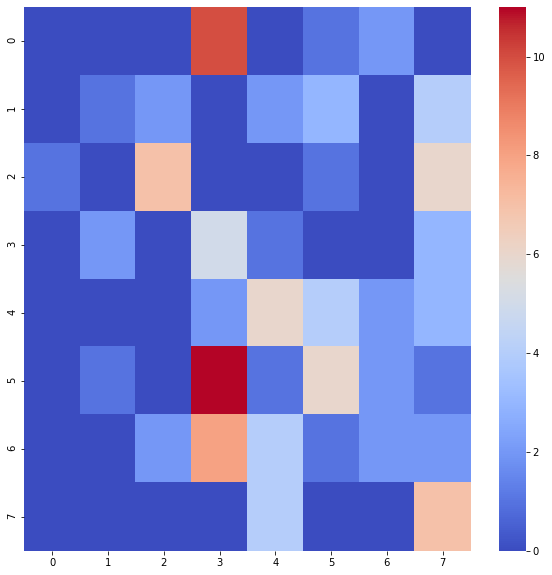

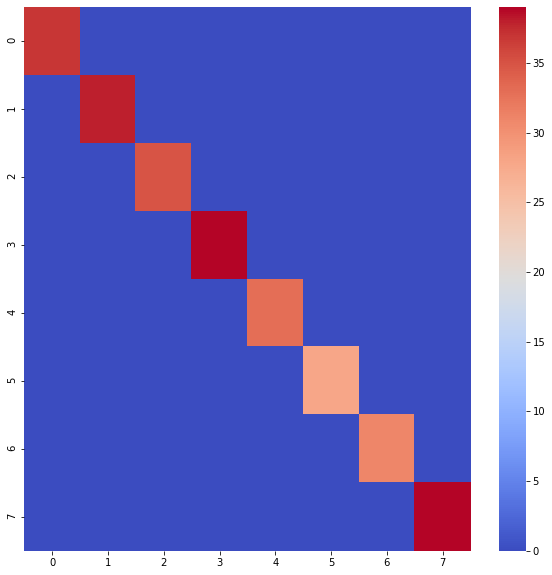

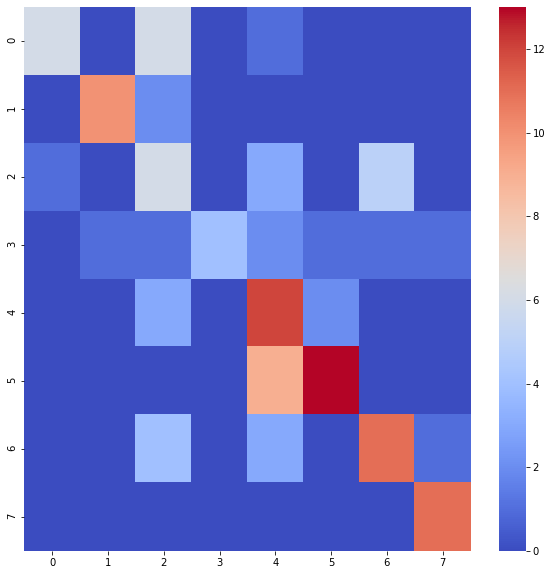

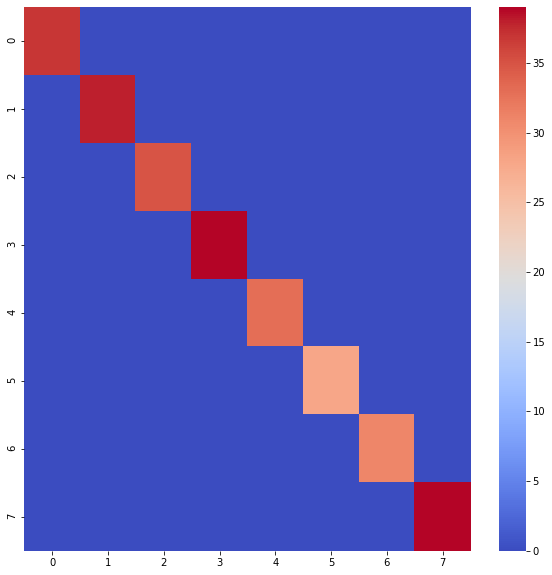

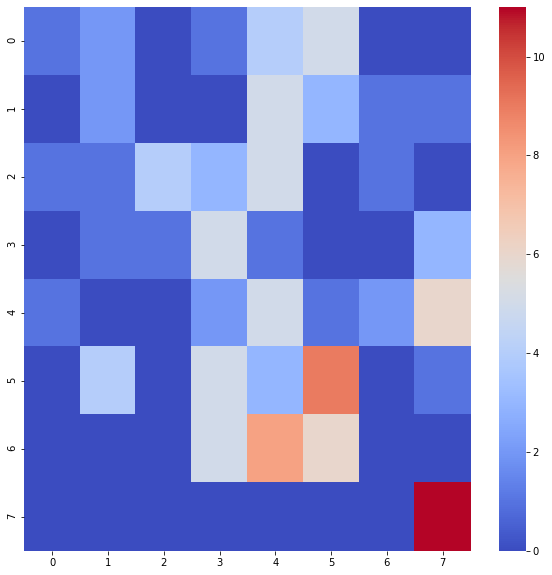

In [198]:
for i in [50, 100, 200, 270]:
    pca = PCA(n_components=i, random_state=19970808, svd_solver="full") #
    X_pca_train = pca.fit_transform(X_train)
    X_pca_test = pca.transform(X_test)
      
    print("Clasiffication using LDA")
    predict_lda = LDA_clasification(X_pca_train, y_train, X_pca_test, y_test)
    
    print("Clasiffication using QDA")
    predict_qda = QDA_clasification(X_pca_train, y_train, X_pca_test, y_test)

Clasiffication using LogRegresion
----------Errors train------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

      coches       1.00      1.00      1.00        37
     hoteles       1.00      1.00      1.00        38
   lavadoras       1.00      1.00      1.00        35
      libros       1.00      1.00      1.00        39
     moviles       1.00      0.97      0.98        33
      musica       0.97      1.00      0.98        28
 ordenadores       0.97      1.00      0.98        31
   peliculas       1.00      0.97      0.99        39

    accuracy                           0.99       280
   macro avg       0.99      0.99      0.99       280
weighted avg       0.99      0.99      0.99       280

----------Errors test------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

      coches       1.00      1.00      1.00        13
     hoteles       1.00      1.00      1.00        12

/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning: The ma

/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning: The ma

----------Errors train------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

      coches       1.00      1.00      1.00        37
     hoteles       1.00      1.00      1.00        38
   lavadoras       1.00      1.00      1.00        35
      libros       1.00      1.00      1.00        39
     moviles       1.00      1.00      1.00        33
      musica       1.00      1.00      1.00        28
 ordenadores       1.00      1.00      1.00        31
   peliculas       1.00      1.00      1.00        39

    accuracy                           1.00       280
   macro avg       1.00      1.00      1.00       280
weighted avg       1.00      1.00      1.00       280

----------Errors test------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

      coches       1.00      1.00      1.00        13
     hoteles       0.92      1.00      0.96        12
   lavadoras       1.00      1.00

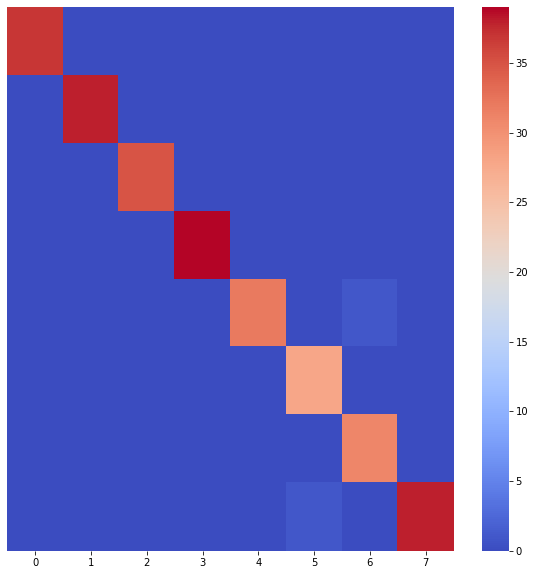

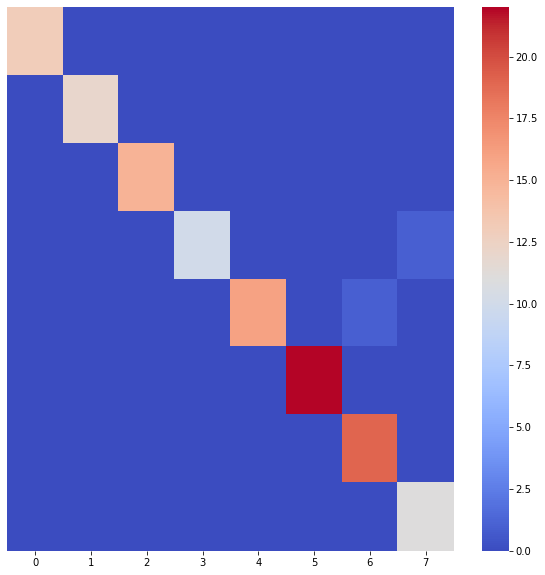

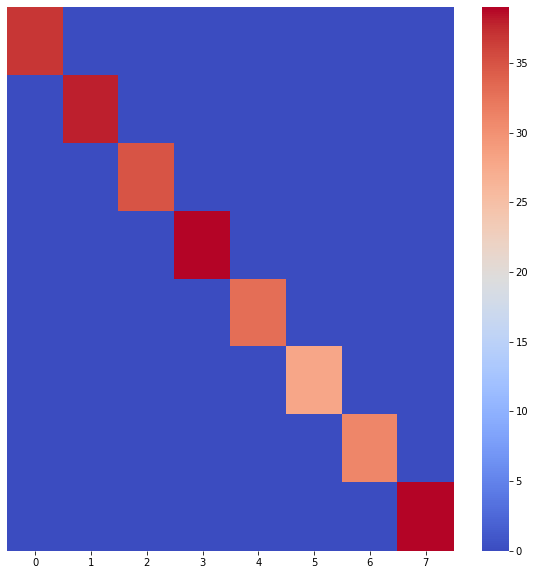

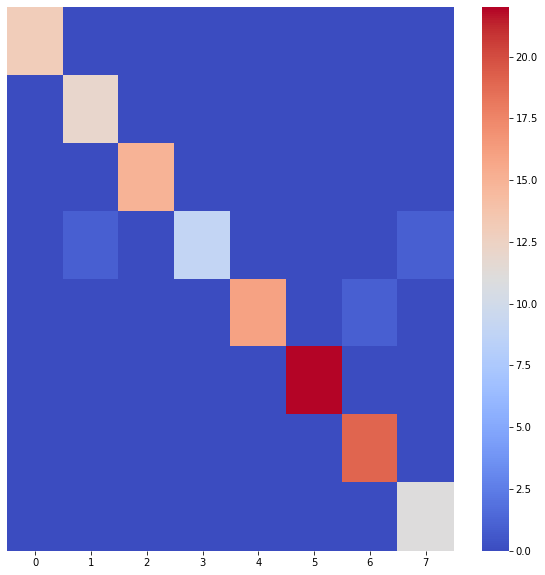

In [200]:
    pca = PCA(n_components=200, random_state=19970808, svd_solver="full") #
    X_pca_train = pca.fit_transform(X_train)
    X_pca_test = pca.transform(X_test)
      
    
    print("Clasiffication using LogRegresion")
    predict_log_m, predict_log_ovr = log_regression_clasification(X_pca_train, y_train, X_pca_test, y_test)

Clasiffication using LogRegresion
----------Errors train------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

      coches       1.00      1.00      1.00        37
     hoteles       1.00      1.00      1.00        38
   lavadoras       1.00      1.00      1.00        35
      libros       1.00      1.00      1.00        39
     moviles       1.00      1.00      1.00        33
      musica       1.00      1.00      1.00        28
 ordenadores       1.00      1.00      1.00        31
   peliculas       1.00      1.00      1.00        39

    accuracy                           1.00       280
   macro avg       1.00      1.00      1.00       280
weighted avg       1.00      1.00      1.00       280

----------Errors test------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

      coches       1.00      1.00      1.00        13
     hoteles       1.00      1.00      1.00        12

/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/home/enrique/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


----------Errors train------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

      coches       1.00      1.00      1.00        37
     hoteles       1.00      1.00      1.00        38
   lavadoras       1.00      1.00      1.00        35
      libros       1.00      1.00      1.00        39
     moviles       1.00      1.00      1.00        33
      musica       1.00      1.00      1.00        28
 ordenadores       1.00      1.00      1.00        31
   peliculas       1.00      1.00      1.00        39

    accuracy                           1.00       280
   macro avg       1.00      1.00      1.00       280
weighted avg       1.00      1.00      1.00       280

----------Errors test------------------
AxesSubplot(0.125,0.125;0.62x0.755)
              precision    recall  f1-score   support

      coches       1.00      1.00      1.00        13
     hoteles       1.00      1.00      1.00        12
   lavadoras       1.00      1.00

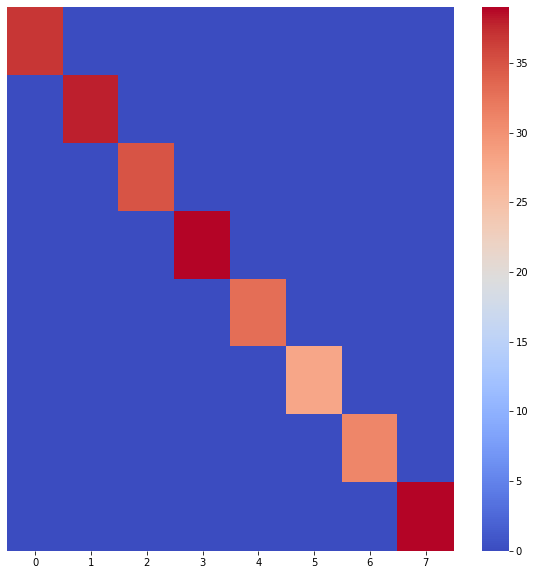

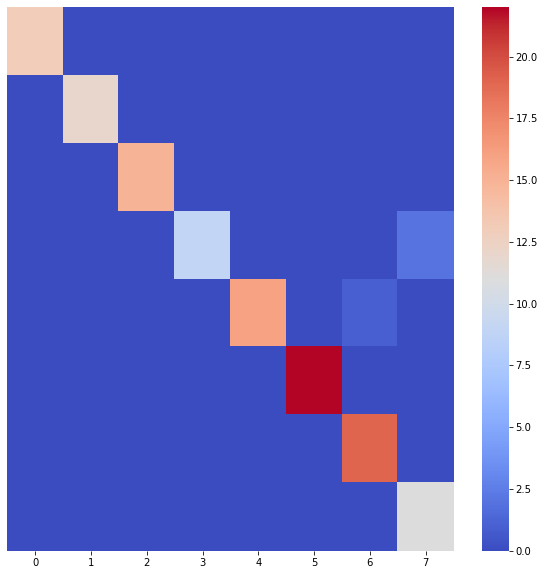

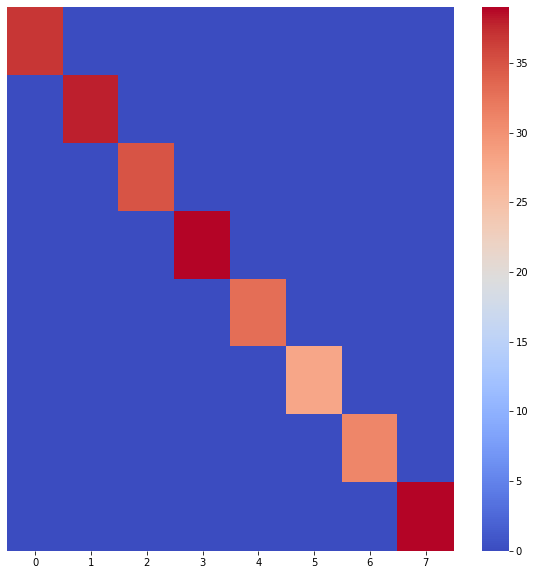

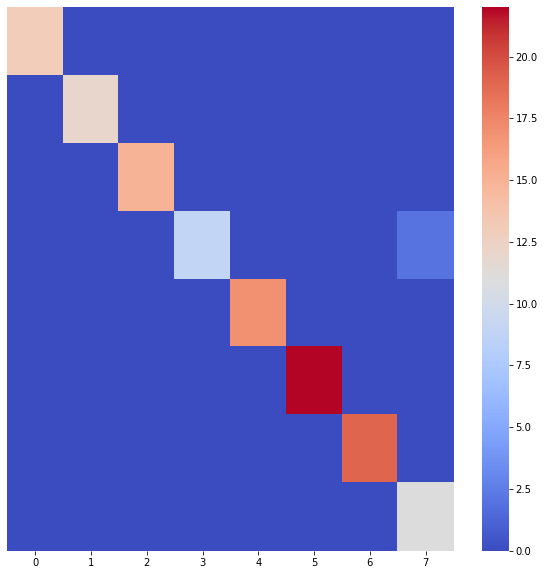

In [199]:
    pca = PCA(n_components=200, random_state=19970808, svd_solver="full") #
    X_pca_train = pca.fit_transform(X_train)
    X_pca_test = pca.transform(X_test)
      
    
    print("Clasiffication using LogRegresion")
    predict_log_m, predict_log_ovr = log_regression_clasification(X_train, y_train, X_test, y_test)